# Investigation of Demographic changes in NYC Neighborhoods
# Objective: Identify specific socioecononomic changes in NYC over 10 years
## Determine homogenous neighborhoods by clustering by socioeconomic characteristics in 2000 and 2010 and then determine which neighborhoods changed
## PUI2016 Fall Final  
### Author: Bailey Griswold, bg1672
**December 17, 2016**  
**Professor Federica Bianco**  
Assignment: https://github.com/fedhere/PUI2016_final/blob/master/PUI2016_final_instructions.ipynb

In [44]:
from __future__ import print_function, division
import numpy as np
import os
import pandas as pd
import zipfile
import geopandas as gp
from geopandas import GeoDataFrame
from fiona.crs import from_epsg
import sklearn as skl
from sklearn import preprocessing
from sklearn.cluster import KMeans
import pylab as pl
import scipy.cluster as scp
import json
import shapely
import scipy.stats
%matplotlib inline
import ast
import json

import urllib
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import io
from fiona.crs import from_epsg

try:
    from urllib.request import urlopen
    from urllib.parse import urlparse
except ImportError:
    from urlparse import urlparse
    from urllib2 import urlopen

%pylab inline

PUIDATA = os.getenv('PUIDATA')

Populating the interactive namespace from numpy and matplotlib


### 1) Find the number of businesses in 2010 and 2000. This information is available at the zipcode level (HW11).

In [2]:
# Download 2000 business data file
#!wget ftp://ftp.census.gov/Econ2001_And_Earlier/CBP_CSV/zbp00totals.zip

# Download the 2010 business data file
#!wget ftp://ftp.census.gov/econ20$y\/CBP_CSV/zbp10\totals.zip; done

#Move data to PUIdata
path = os.getenv('PUIDATA')+'/'
!mv *.zip "{path}"

mv: cannot stat `*.zip': No such file or directory


In [3]:
# set a dataframe of only NYC zip codes
nyc_zips = (np.append(np.array(range(10000,10500)),np.array(range(11000,11500))))
biz = pd.DataFrame(nyc_zips)
biz['zip'] = biz[0]
biz.drop(0, axis=1, inplace = True)

In [4]:
# open the business census data and pull out appropriate information
for i in [0, 10]:
    if i < 10:
        set = '0' + str(i)
        year = ('20'+ set)
    else:
        set = str(i)
        year = ('20'+ set)
    fname = "zbp" + set + "totals.zip"
    zf = zipfile.ZipFile(path + fname)
    df = pd.read_csv(zf.open(fname.replace('.zip','.txt')))
    df.columns = map(str.lower, df.columns)
    df['zip'] = pd.to_numeric(df['zip'], errors = 'coerce')
    df = df[['zip', 'est']]
    df.rename(columns={"est" : year+'_est'}, inplace = True)
    biz = pd.merge(biz, df, on='zip', how='left')

In [5]:
biz.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000 entries, 0 to 999
Data columns (total 3 columns):
zip         1000 non-null int64
2000_est    313 non-null float64
2010_est    309 non-null float64
dtypes: float64(2), int64(1)
memory usage: 31.2 KB


In [6]:
# Drop Null Values
biz.dropna(how = 'any', inplace = True)

In [7]:
biz.head()

,zip,2000_est,2010_est
1,10001,7317.0,7241.0
2,10002,2277.0,2872.0
3,10003,3683.0,4113.0
4,10004,1294.0,1398.0
5,10005,1287.0,1266.0


In [8]:
#check dataframe
print ('2000 Nulls: ', len(biz[(biz['2000_est'].isnull())]))
print ('2010 Nulls: ', len(biz[(biz['2010_est'].isnull())]))

2000 Nulls:  0
2010 Nulls:  0


In [9]:
biz.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 291 entries, 1 to 951
Data columns (total 3 columns):
zip         291 non-null int64
2000_est    291 non-null float64
2010_est    291 non-null float64
dtypes: float64(2), int64(1)
memory usage: 9.1 KB


Since the objective is to determine the cahnges from 2000 to 2010, all null values were dropped.  To determine the change from 2000 to 2010, only zipcodes with values for both years are usefel. This leaves 291 observations in the dataset

### 2) Gather a zipcode shapefile and merge the number of businesses with the zipcode shapfile

In [10]:
#Download NYC census tract shape files - code from a hw
!curl -O "https://raw.githubusercontent.com/fedhere/PUI2016_fb55/master/HW11_fb55/nyc-zip-code-tabulation-areas-polygons.geojson"
shapefile="nyc-zip-code-tabulation-areas-polygons.geojson"
os.system("mv " + shapefile + " " + os.getenv("PUIDATA"))
shapefile = PUIDATA +"/nyc-zip-code-tabulation-areas-polygons.geojson"

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  591k  100  591k    0     0  1219k      0 --:--:-- --:--:-- --:--:-- 3630k


In [11]:
nyczipshp = gp.read_file(shapefile)
nyczipshp.rename(columns = {'postalCode': 'zip'}, inplace=True)
nyczipshp['zip'] = (pd.to_numeric(nyczipshp['zip'], errors = 'coerce'))
nyczipshp.drop(['@id', 'BLDGpostalCode', 'Shape_Area', 'OBJECTID', 'STATE',
       'Shape_Leng'], axis=1, inplace=True)
#nyczipshp.zipcode = nyczipshp.zipcode.astype(str)

In [12]:
# make a geo_id prefix that has US code and state code, add on the cty fips
id_prefx = '1400000US360'
nyczipshp['geo_id_prefx'] = id_prefx + nyczipshp.CTY_FIPS

In [13]:
print ("ZIPCODES:", len(np.unique(nyczipshp.zip)), 
       "POLYGONS:", len(nyczipshp.zip),
       "the difference is due to island with same zip as parts of land,", 
       "but disjoint shapes")

ZIPCODES: 247 POLYGONS: 262 the difference is due to island with same zip as parts of land, but disjoint shapes


There are 247 zipcodes in the shapefile, so it appears that reducing the business establishments dataset was appropriate.

In [14]:
#Merge zipcode and business dataframes
nyc_biz = pd.merge(nyczipshp, biz, on='zip', how='inner')

In [15]:
print (nyc_biz.head())
print("Zipcode business entries: ", len(nyc_biz))

  CTY_FIPS          PO_NAME ST_FIPS borough  \
0      081  Jackson Heights      36  Queens   
1      081        Glen Oaks      36  Queens   
2      081    New Hyde Park      36  Queens   
3      081        Bellerose      36  Queens   
4      081    Fresh Meadows      36  Queens   

                                            geometry    zip     geo_id_prefx  \
0  POLYGON ((-73.86942457284175 40.74915687096787...  11372  1400000US360081   
1  POLYGON ((-73.71068374074007 40.75004039450917...  11004  1400000US360081   
2  POLYGON ((-73.70098278625547 40.73889569923034...  11040  1400000US360081   
3  POLYGON ((-73.72270447144122 40.75373371438336...  11426  1400000US360081   
4  POLYGON ((-73.81088634744755 40.72717187575918...  11365  1400000US360081   

   2000_est  2010_est  
0    1409.0    1629.0  
1     189.0     229.0  
2    1350.0    1494.0  
3     213.0     248.0  
4     553.0     643.0  
Zipcode business entries:  242


There are 242 entries in the merged zipcode and business establishment dataset, so only five zipcodes appear to have been lost. 

### 3) Find the density of businesses and show them the density in a choropleth 
A) divide the number of businesses by the area of the zipcode (see the hints file if you need to)    
B) Choropleth = a heatmap version of a geographical map where each zipcode (census tract later) is a different color based on the value of the feature you are mapping) for 2000 and 2010   
C) (OPTIONALLY: also show the difference in business density between 2000 and 2010 in a map, this will help you make sure you are on the right track)  

In [16]:
# Set projection and calculate area in square feet, convert to square miles
nyc_biz.crs = from_epsg(4326)
nyc_biz['Shape_Area'] = nyc_biz.to_crs(epsg=2263).geometry.area/(2.788*10**7)
NYC_Area = nyc_biz.to_crs(epsg=2263).geometry.area.sum()/(2.788*10**7) # from ft2 to mi2 
NYC_area = nyc_biz['Shape_Area'].sum()
print ('total NYC land area: {} (mi^2)'.format(str(NYC_Area)[:5]))
print ('total NYC land area: {} (mi^2)'.format(str(NYC_area)[:5]))

total NYC land area: 288.1 (mi^2)
total NYC land area: 288.1 (mi^2)


In [17]:
area_mean = mean(nyc_biz.Shape_Area)

print ('Median Shape Area: ', median(nyc_biz.Shape_Area))
print ('Mean Shape Area: ', area_mean)
print ('Standard Deviation: ', std(nyc_biz.Shape_Area))
print ('Min Area: ', min(nyc_biz.Shape_Area))
print ('Max Area: ', max(nyc_biz.Shape_Area))

Median Shape Area:  0.823774423523
Mean Shape Area:  1.1906275448
Standard Deviation:  1.63966197356
Min Area:  0.000408387274979
Max Area:  17.0029241851


In [18]:
# Dividing Shape_Area by the mean to adjust the order of magnitude
nyc_biz.Shape_Area = nyc_biz.Shape_Area/area_mean

In [19]:
#Calculate the density of businesses in each zipcode
#divide the number of businesses by the area of the zipcode 
nyc_biz['2000_density'] = nyc_biz['2000_est']/nyc_biz['Shape_Area']
nyc_biz['2010_density'] = nyc_biz['2010_est']/nyc_biz['Shape_Area']
nyc_biz['dens_change'] = nyc_biz['2010_density'] - nyc_biz['2000_density']

In [20]:
dendelt_stdv = std(nyc_biz.dens_change)

print ('Median Change in Density: ', median(nyc_biz.dens_change))
print ('Mean Change in Density: ', mean(nyc_biz.dens_change))
print ('Standard Deviation: ', dendelt_stdv)
print ('min: ', min(nyc_biz.dens_change))
print ('max: ', max(nyc_biz.dens_change))

Median Change in Density:  73.8012855978
Mean Change in Density:  -7107.0607056
Standard Deviation:  36806.3879058
min:  -353652.606951
max:  67055.0607432


The large difference between the median and the mean indicates the presence of very large outliers that are unbalancing the dataset.  These few datapoints will obscure changes in most of the rest of the data. 

(array([   1.,    1.,    0.,    1.,    0.,    2.,    6.,    7.,  221.,    3.]),
 array([-353652.60695063, -311581.84018125, -269511.07341187,
        -227440.30664249, -185369.53987311, -143298.77310373,
        -101228.00633435,  -59157.23956497,  -17086.47279559,
          24984.29397379,   67055.06074317]),
 <a list of 10 Patch objects>)

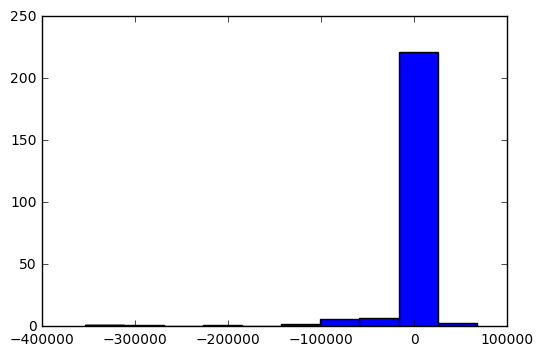

In [21]:
#checking to see range of density change values
hist(nyc_biz.dens_change)

Since most values are betwee -10,000 and 10,000 for changes in density, I am removing values outside that to clarify the map.

In [22]:
#How many values are outside of -10000 and 10000?

outliers = (nyc_biz['dens_change'] <= -10000) + (nyc_biz['dens_change'] >= 10000)
print ("Number of values beyond -10k and 10k: ", len(nyc_biz[outliers]))
print ('Percent of datapoints beyond range: ', (len(nyc_biz[outliers]))/len(nyc_biz)*100)

Number of values beyond -10k and 10k:  32
Percent of datapoints beyond range:  13.223140495867769


/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/pandas/computation/expressions.py:181: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  unsupported[op_str]))


In [23]:
# Removing outlier data points
nyc_biz1 = nyc_biz[~outliers]
print ('Number of Values: ', len(nyc_biz1))
print ('Mean Change in Density: ', mean(nyc_biz1.dens_change))
print ('Median Change in Density: ', median(nyc_biz1.dens_change))
print ('Standard Deviation: ', std(nyc_biz1.dens_change))

print ('min: ', min(nyc_biz1.dens_change))
print ('max: ', max(nyc_biz1.dens_change))

Number of Values:  210
Mean Change in Density:  96.0391779095
Median Change in Density:  91.8201416494
Standard Deviation:  1509.91650182
min:  -9175.65049425
max:  7595.35478845


With the outliers removed, the mean and median are much closer (96 vs 91).  Previously, the mean was vastly different from the mean (-7107 and 73).  The standard deviation is also smaller with outliers removed (1509 compared to 36806), but there is still a wide range in values.

(array([   1.,    1.,    2.,    3.,    9.,  179.,    5.,    6.,    3.,    1.]),
 array([-9175.65049425, -7498.54996598, -5821.44943771, -4144.34890944,
        -2467.24838117,  -790.1478529 ,   886.95267537,  2564.05320364,
         4241.15373191,  5918.25426018,  7595.35478845]),
 <a list of 10 Patch objects>)

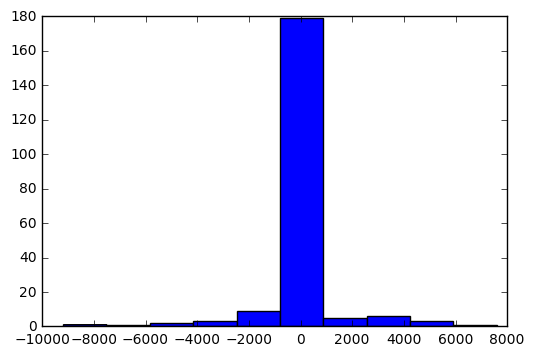

In [24]:
#checking to see range of density change values
hist(nyc_biz1.dens_change)

In [25]:
bzmean = mean(nyc_biz1.dens_change)
stdev = std(nyc_biz1.dens_change)
density_delt_ol = (nyc_biz['dens_change'] <= (bzmean - stdev)) + (nyc_biz['dens_change'] >= (bzmean + stdev))
print ("Number of values beyond 1 stdev past mean: ", len(nyc_biz[density_delt_ol]))
print ('Percent of datapoints beyond range: ', (len(nyc_biz[density_delt_ol]))/len(nyc_biz)*100)

Number of values beyond 1 stdev past mean:  58
Percent of datapoints beyond range:  23.96694214876033


/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/pandas/computation/expressions.py:181: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  unsupported[op_str]))


In [26]:
hist(nyc_biz2.dens_change)

NameError: name 'nyc_biz2' is not defined

Clarifying the data a second time removes a total of 58 detapoints, which amounts to 23% of the data.  This is a lot of datapoints to remove, but these datapoints are too large for plotting together on a choropleth.  In this case, it is appropriate to only plot roughtly 77% of the datset since there is such a great difference between this 23% of the dataset and the rest of it. 

In [27]:
# Removing outlier data points
nyc_biz2 = nyc_biz[~density_delt_ol]
print ('Number of Values: ', len(nyc_biz2))
print ('Mean Change in Density: ', mean(nyc_biz2.dens_change))
print ('Median Change in Density: ', median(nyc_biz2.dens_change))
print ('Standard Deviation: ', std(nyc_biz2.dens_change))

print ('min: ', min(nyc_biz2.dens_change))
print ('max: ', max(nyc_biz2.dens_change))

Number of Values:  184
Mean Change in Density:  139.362538557
Median Change in Density:  93.520407757
Standard Deviation:  276.643807291
min:  -1042.71861147
max:  1582.70049209


/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/geopandas/plotting.py:225: FutureWarning: 'colormap' is deprecated, please use 'cmap' instead (for consistency with matplotlib)
  "(for consistency with matplotlib)", FutureWarning)
/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/geopandas/plotting.py:229: FutureWarning: 'axes' is deprecated, please use 'ax' instead (for consistency with pandas)
  "(for consistency with pandas)", FutureWarning)


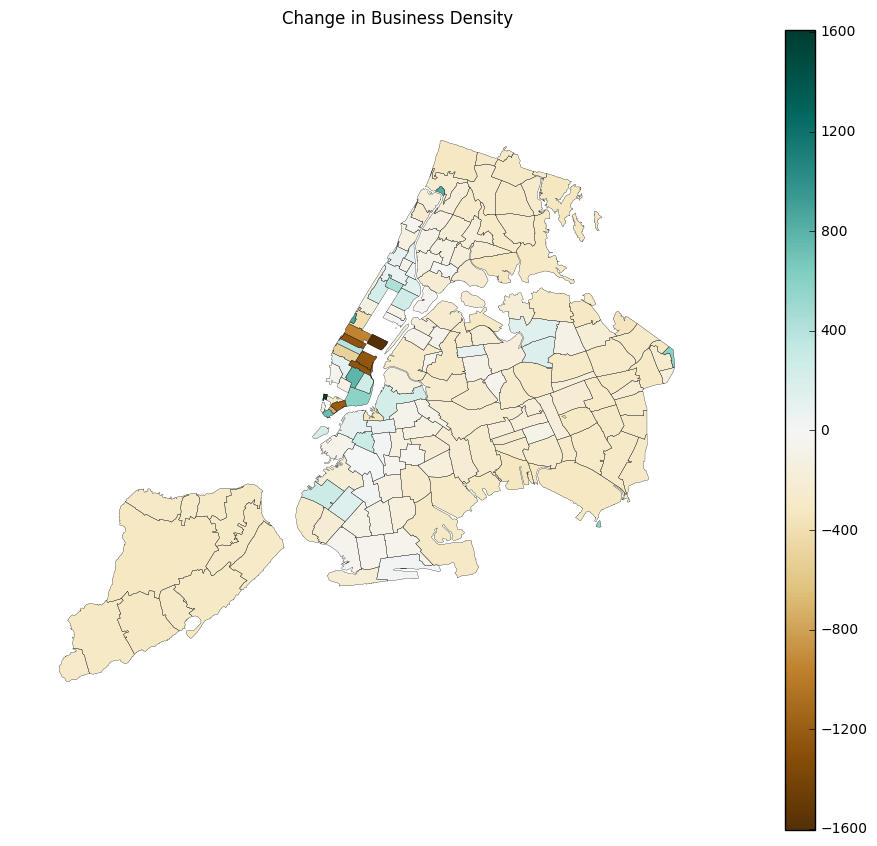

In [55]:
f, ax = plt.subplots(figsize=(10,10))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
nyc_biz2.plot(column='dens_change',colormap='coolwarm',alpha=1,linewidth=0.1,ax=ax)
plt.title("Change in Business Density")

ax = nyc_biz2.plot(column='dens_change', colormap='BrBG',alpha = 1, linewidth=0.1, axes=ax)
vmin, vmax = -(bzmean+stdev), (bzmean+stdev)
            
ax.axis('off')
fig = ax.get_figure()
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(cmap='BrBG', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
fig.colorbar(sm, cax=cax)

## Figure 1 Change in Density of Businesses per Zipcode from 2000 to 2010
This graph shows the change in density of business per zipcode from the 2000 census to the 2010 census.  Areas in white show no change in density of businesses from 2000 to 2010.  Areas in grean saw an increase, and areas that are brown saw a decrease in the density of businesses.  Several zipcodes in downtown Manhattan saw dramatic reductions in the density of businesses, which is likely due to large construction projects that required buildings to be torn down, and the subsequent loss of the businesses in those buildings. The area surrounding downtown Brooklyn saw an increase in businesses, as did uptown Manhattan and some part of Queens.  These are likely neighborhoods that were gentrified in that time period, turning into desireable places to live, such as Williamsburg, Greenpoint, Clinton Hill, Fort Green, Cobble Hill, Carroll Gardens, West Harlem, Astoria and Long Island City. The outer edges of the outer burroughs all saw a decreased density of businesses, as did all the zipcodes in Staten Island.

/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/geopandas/plotting.py:225: FutureWarning: 'colormap' is deprecated, please use 'cmap' instead (for consistency with matplotlib)
  "(for consistency with matplotlib)", FutureWarning)
/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/geopandas/plotting.py:229: FutureWarning: 'axes' is deprecated, please use 'ax' instead (for consistency with pandas)
  "(for consistency with pandas)", FutureWarning)


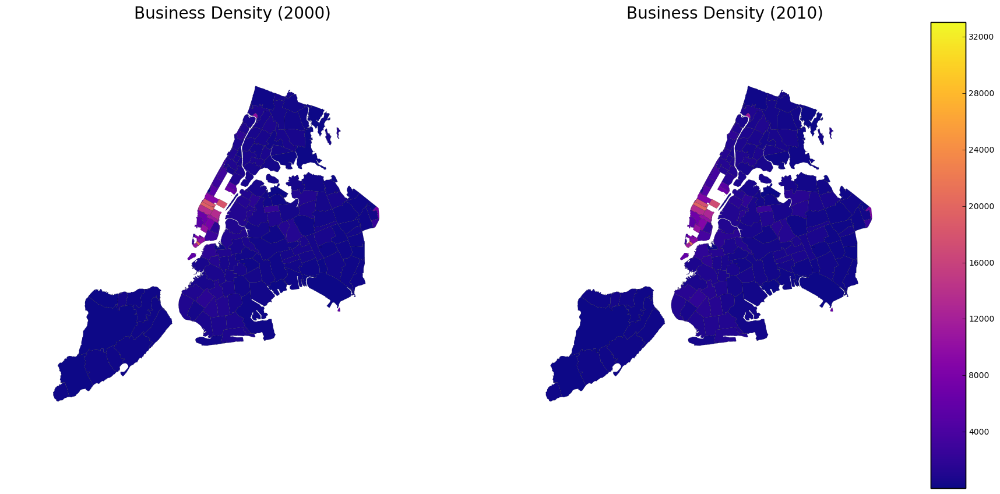

In [28]:
f, ax = plt.subplots(figsize=(20,10))

ax1 = plt.subplot(121)
ax1 = nyc_biz2.plot(column='2000_density' , colormap='plasma',alpha = 1, linewidth= 0.1, axes=ax1)
plt.title("Business Density (2000)", fontsize=20)
vmin, vmax = min(nyc_biz2['2000_density'].values), \
            max(nyc_biz2['2000_density'].values)
ax1.axis('off')
fig = ax1.get_figure()
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(cmap='BuGn', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
fig.colorbar(sm, cax=cax)

ax2 = plt.subplot(122)
ax2 = nyc_biz2.plot(column='2010_density', colormap='plasma',alpha = 1, linewidth = 0.1, axes=ax2)
plt.title("Business Density (2010)", fontsize=20)
ax2.axis('off')
fig = ax2.get_figure()
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(cmap='plasma', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
fig.colorbar(sm, cax=cax)

## Figure 2 Density of Businesses per Zipcode in 2000 and 2010
Business density in 2000 and 2010 are plotted.  The dataset was modified, removing 23% of points that had an extreme change in density from 2000 to 2010. Midtown Manhattan has the greatest density of businesses. This is not surprising: this area has some of the tallest buildings, and is home to several different industries: theatre, tourism, television, among others.

/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/geopandas/plotting.py:225: FutureWarning: 'colormap' is deprecated, please use 'cmap' instead (for consistency with matplotlib)
  "(for consistency with matplotlib)", FutureWarning)
/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/geopandas/plotting.py:229: FutureWarning: 'axes' is deprecated, please use 'ax' instead (for consistency with pandas)
  "(for consistency with pandas)", FutureWarning)


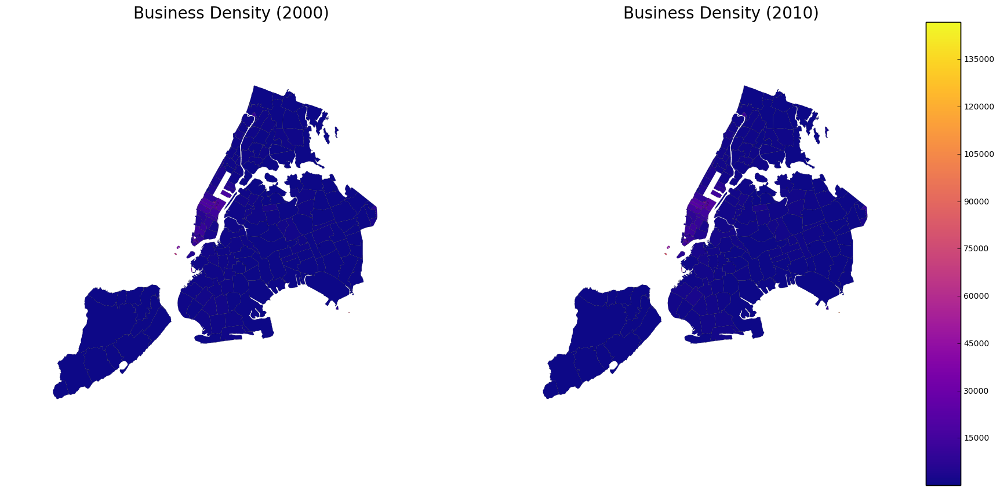

In [126]:
f, ax = plt.subplots(figsize=(20,10))
ax1.text(-74, 41,'This text', fontsize=20)
ax1 = plt.subplot(121)
ax1 = nyc_biz3.plot(column='2000_density' , colormap='plasma',alpha = 1, linewidth= 0.1, axes=ax1)
plt.title("Business Density (2000)", fontsize=20)
vmin, vmax = min(nyc_biz['2000_density'].values), \
            max(nyc_biz3['2000_density'].values)
ax1.axis('off')
fig = ax1.get_figure()
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(cmap='BuGn', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
fig.colorbar(sm, cax=cax)

ax2 = plt.subplot(122)
ax2 = nyc_biz3.plot(column='2010_density', colormap='plasma',alpha = 1, linewidth = 0.1, axes=ax2)
plt.title("Business Density (2010)", fontsize=20)
ax2.axis('off')
fig = ax2.get_figure()
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(cmap='plasma', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
fig.colorbar(sm, cax=cax)

# Figure 3 Density of Businesses by Zipcode in NYC in 2000 and 2010
The resolution of this map is not clear at all.  The highest density zipcodes are in midtown Manhattan (there there is the greatest density of businesses in general) and have incredibly small area due to the fact that these zipcodes represent only one city block.  They show up on the map, but are so small relative to the rest of the city that there are barely percieveable. 

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fcc7d443b70>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x7fcc79983898>]], dtype=object)

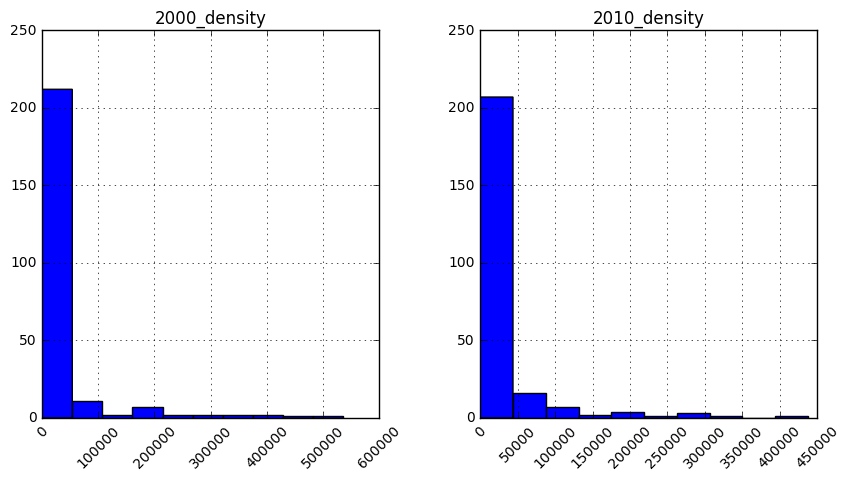

In [29]:
#distribution of density in 2000 and 2010
nyc_biz.hist(column=['2000_density', '2010_density'], figsize= (10,5), xrot=45)

# Figure 4 Distribution of Business Density across Zipcodes in 2000 and 2010
A vast majority of values are at the lower end, but there are some (not a negligeable amount) of zipcodes that have a business density that is by comparison vastly greater than the majority of zipcodes.

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fcc7a186c88>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x7fcc788ae9e8>]], dtype=object)

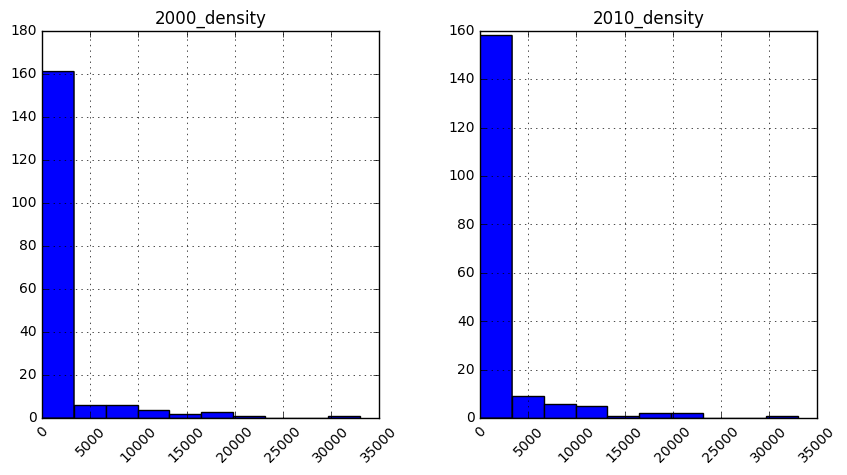

In [30]:
nyc_biz2.hist(column=['2000_density', '2010_density'], figsize= (10,5), xrot=45)

# Figure 5: As Figure 4, but with outliers removed
The adjusted dataset that these densisty distributions is pulled from had the change in density outliers removed.  Although this dataset has a more informative choropleth (as shown in Figure 2 as compared to Figure 3). Improved resolution can be achieved. 

In [31]:
density00_ol = (nyc_biz['2000_density'] >= (150000))
density10_ol = (nyc_biz['2010_density'] >= (150000))
print ("Number of density (2000) values >150000: ", len(nyc_biz[density00_ol]))
print ("Number of density (2010) values >150000: ", len(nyc_biz[density10_ol]))
print ('Percent of datapoints beyond range: ', (len(nyc_biz[density00_ol]))/len(nyc_biz)*100)
print ('Percent of datapoints beyond range: ', (len(nyc_biz[density10_ol]))/len(nyc_biz)*100)

Number of density (2000) values >150000:  17
Number of density (2010) values >150000:  12
Percent of datapoints beyond range:  7.024793388429752
Percent of datapoints beyond range:  4.958677685950414


By removing all the datapoints with a density greater than 150000, it only amounts to 7% and 5% of the 2000 and 2010 datasets (respectively).  Considering that nearly a quarter of the datapoints were removed to clarify the resolution of the density change graph, this value is modest, and perhaps we could stand to remove a few more.

In [32]:
print ('Number of common outlier datapoints in 2000 and 2010: ', len(nyc_biz[density00_ol * density10_ol]))

Number of common outlier datapoints in 2000 and 2010:  12


/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/pandas/computation/expressions.py:181: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))


All 12 of the 2010 density outliers are also in the 2000 dataset, which has 17 datapoints in it. 

In [33]:
# Removing outlier data points
nyc_biz3 = nyc_biz[~density00_ol]
print ('Number of Values: ', len(nyc_biz3))
print ('Mean Density (2000): ', mean(nyc_biz3['2000_density']))
print ('Mean Density (2010): ', mean(nyc_biz3['2010_density']))
print ('Median Density (2000): ', median(nyc_biz3['2000_density']))
print ('Median Density (2010): ', median(nyc_biz3['2010_density']))
print ('Standard Deviation (2000): ', std(nyc_biz3['2000_density']))
print ('Standard Deviation (2010): ', std(nyc_biz3['2010_density']))

print ('min (2000): ', min(nyc_biz3['2000_density']))
print ('max (2000): ', max(nyc_biz3['2000_density']))
print ('min (2010): ', min(nyc_biz3['2010_density']))
print ('max (2010): ', max(nyc_biz3['2010_density']))

Number of Values:  225
Mean Density (2000):  9939.2102573
Mean Density (2010):  9357.18989447
Median Density (2000):  762.695208889
Median Density (2010):  951.330251376
Standard Deviation (2000):  21800.8507107
Standard Deviation (2010):  20507.1912462
min (2000):  6.38494245319
max (2000):  146833.285401
min (2010):  9.57741367979
max (2010):  128279.246639


The mean is much different from the median (~10,000 compared to ~800), and the standard deviation is very large (~21,000), which indicates that there are still heavy datapoints that will obscure the rest of the data.

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fcc78838f60>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x7fcc787bdb00>]], dtype=object)

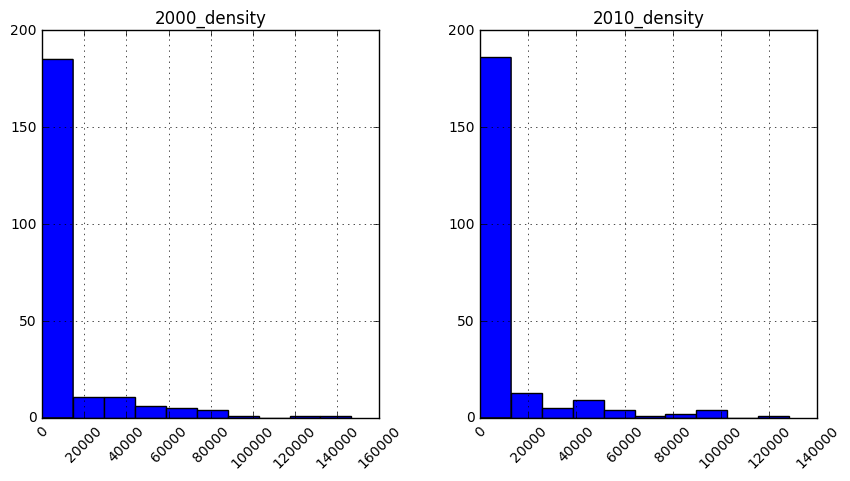

In [34]:
nyc_biz3.hist(column=['2000_density', '2010_density'], figsize= (10,5), xrot=45)

# Figure 6 As Figure 5, but with more datapoints removed.
Values greater than 150,000 were removed (12 outliers).  The remaining datapoints were plotted to show there distribution.  Even still, with those outliers removed, most of the data is clumped at the lower end, with a few points with very large values.

/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/geopandas/plotting.py:225: FutureWarning: 'colormap' is deprecated, please use 'cmap' instead (for consistency with matplotlib)
  "(for consistency with matplotlib)", FutureWarning)
/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/geopandas/plotting.py:229: FutureWarning: 'axes' is deprecated, please use 'ax' instead (for consistency with pandas)
  "(for consistency with pandas)", FutureWarning)


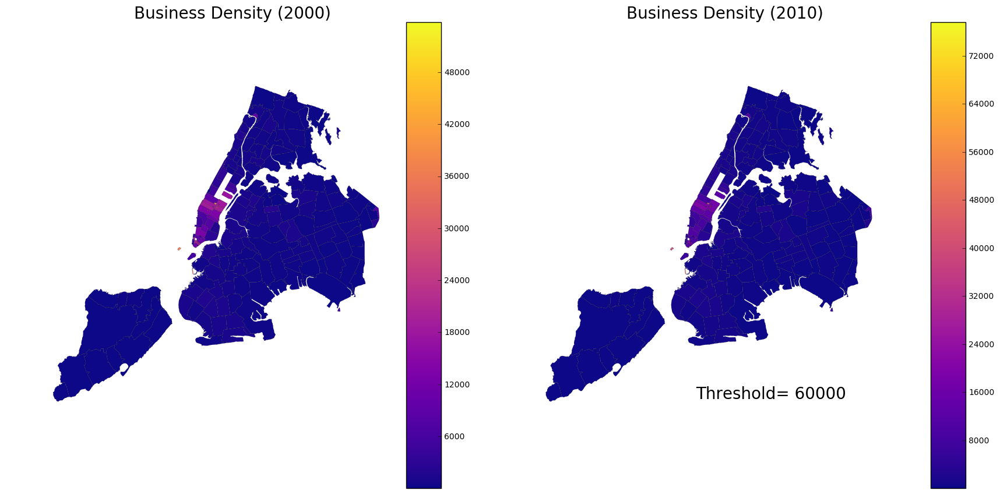

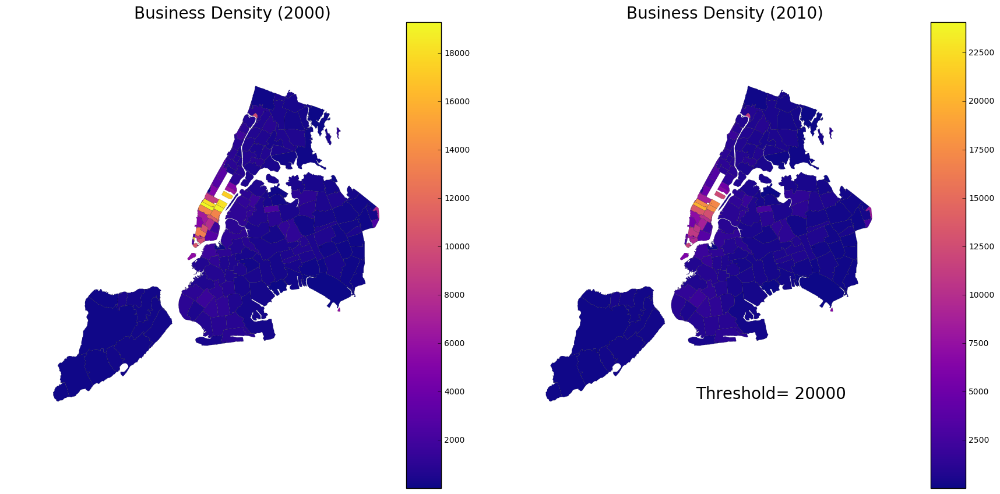

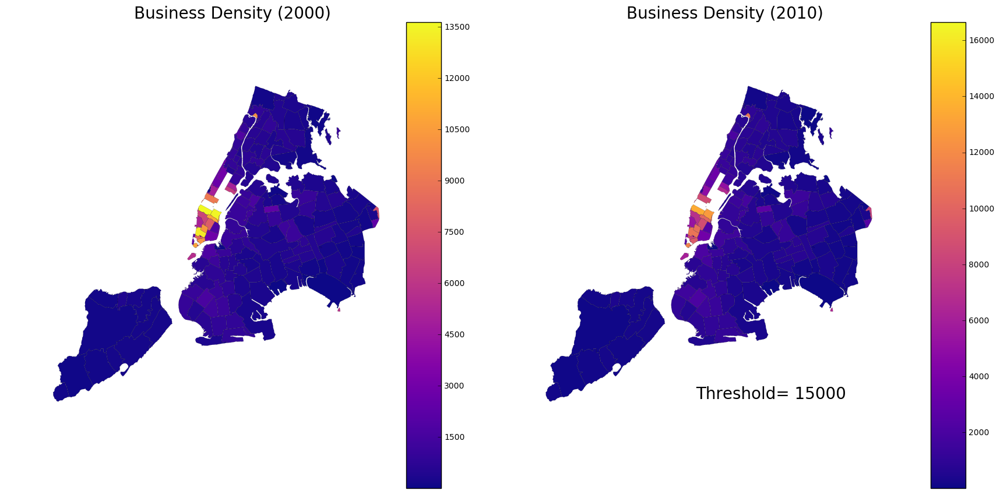

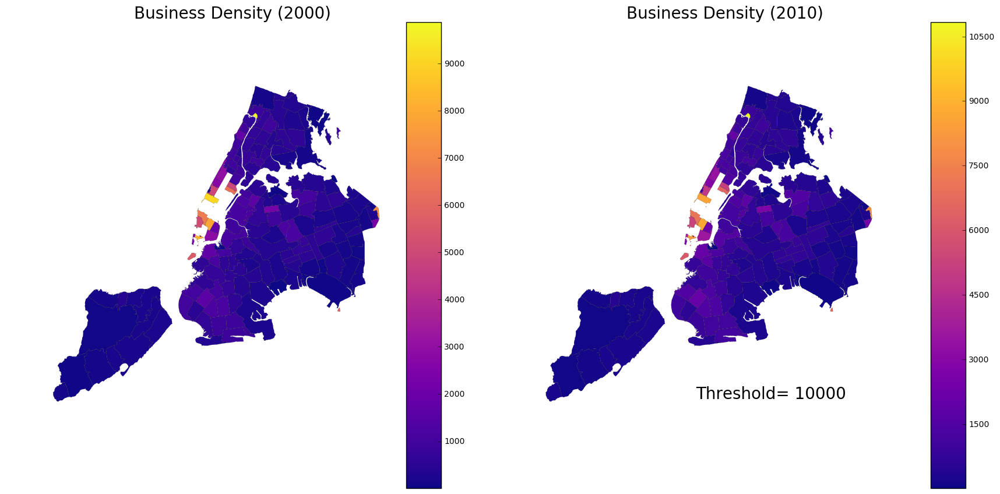

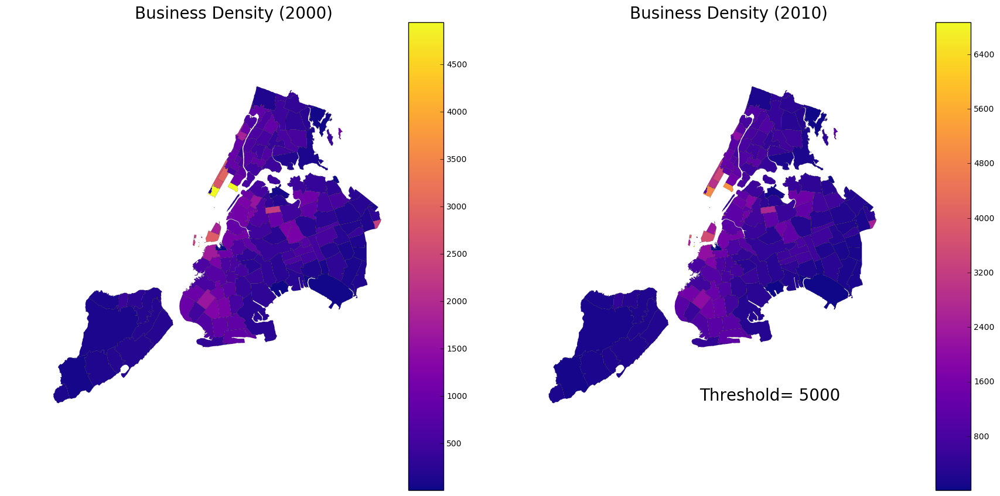

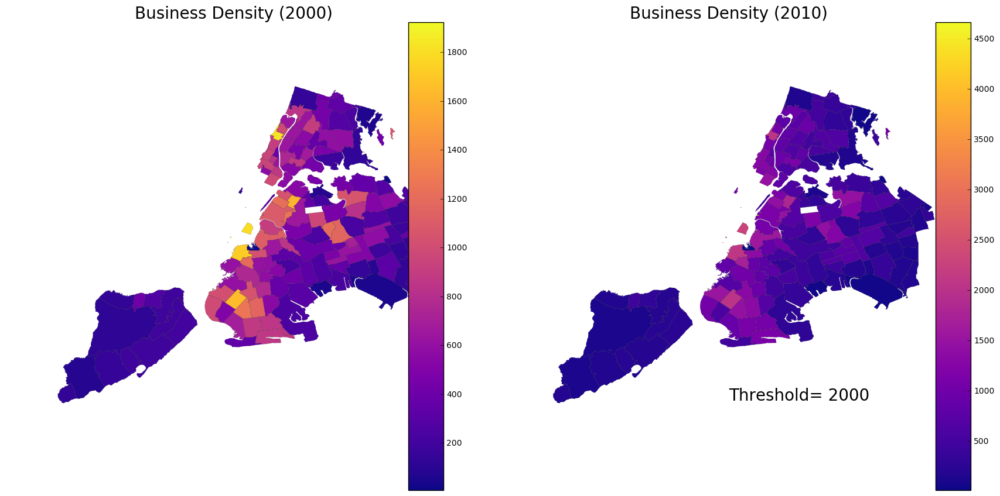

In [35]:
threshold = [60000, 20000, 15000, 10000, 5000, 2000]
for i in threshold:
    nyc_biz4 = nyc_biz[nyc_biz['2000_density'] <= i]
    f, ax = plt.subplots(figsize=(20,10))

    ax1 = plt.subplot(121)
    ax1 = nyc_biz4.plot(column='2000_density' , colormap='plasma',alpha = 1, linewidth= 0.1, axes=ax1)
    plt.title("Business Density (2000)", fontsize= 20)
    vmin, vmax = min(nyc_biz4['2000_density'].values), \
                max(nyc_biz4['2000_density'].values)
    ax1.axis('off')
    fig = ax1.get_figure()
    cax = fig.add_axes([0.45, 0.1, 0.03, 0.8])
    sm = plt.cm.ScalarMappable(cmap='plasma', norm=plt.Normalize(vmin=vmin, vmax=vmax))
    sm._A = []
    fig.colorbar(sm, cax=cax)

    ax2 = plt.subplot(122)
    ax2 = nyc_biz4.plot(column='2010_density', colormap='plasma',alpha = 1, linewidth = 0.1, axes=ax2)
    plt.title("Business Density (2010)", fontsize = 20)
    ax2.axis('off')
    fig = ax2.get_figure()
    cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
    vmin, vmax = min(nyc_biz4['2010_density'].values), \
                max(nyc_biz4['2010_density'].values)
    sm = plt.cm.ScalarMappable(cmap='plasma', norm=plt.Normalize(vmin=vmin, vmax=vmax))
    sm._A = []
    fig.colorbar(sm, cax=cax)
    ax2.text(-74, 40.5, 'Threshold= {}'.format(i), fontsize=20)

# Figure 7, as Figure 3
To see the relative densities of the businesses in all the zipcodes, several chorpleths are plotted in a series of decreasing thresholds.  Figure 3 plotted all the zipcodes, with the exception of 12 zipcodes that had a density greater than 150,000.  The first set in this series, plots everything under a density of 60,000. As in Figure 3, Midtown Manhattan shows the greatest density of businesses, but some other areas of suprisingy high density also appear: Marble Hill in northern Manhattan (technically Manhattan, although it is on the Bronx side of the Harlem River).  The next set of graphs, with a threshold of 20,000 and 15,000 furhter emphasize the previous analysis. The middle of QUeens, and the western edge of Brooklyn, and the northern part of Manhattan also indicate relatively higher density of businesses, which is further empahsized in the following heat maps (thresholds of 10,000, 5,000 and 2,000). [Note: the 2010 heat maps all appear to have a lower overall density than the 2000 heat maps.  Notice the scales on each graph; they are not the same]

# Pull and process 2000 and 2010 census data in steps 4, 5, 6
(use pre-wrangled data)

census2000 : http://cosmo.nyu.edu/~fb55/PUI2016/data/census00_final.json  
census2010 : http://cosmo.nyu.edu/~fb55/PUI2016/data/census10_final.json

In [73]:
def get_jsonparsed_data(url):
    """
    from http://stackoverflow.com/questions/12965203/how-to-get-json-from-webpage-into-python-script
    Receive the content of ``url``, parse it as JSON and return the object.
    Parameters
    ----------
    url : str
    Returns
    -------
    dict
    """
    response = urlopen(url)
    data = response.read().decode("utf-8")
    return json.loads(data)

*** Download census data for 2000 and 2010 ***

In [74]:
#download pre-wrangled census json data from pui class website
url10 = 'http://cosmo.nyu.edu/~fb55/PUI2016/data/census10_final.json'
census10 = pd.DataFrame.from_dict(get_jsonparsed_data(url10),dtype=int)

# pull out zipcodes from geo id
ct = []
for i in range(len(census10)):
    ct.append(census10.geo_id[i][-6:]) 
census10['CT2010'] = ct

#set index to be the zipcode
#census10.index=census10.zipcode

url00 = 'http://cosmo.nyu.edu/~fb55/PUI2016/data/census00_final.json'
census00 = pd.DataFrame.from_dict(get_jsonparsed_data(url00),dtype=int)

# pull out zipcodes from geo id
ct = []
for i in range(len(census00)):
    ct.append(census00.geo_id[i][-6:]) 
census00['CT2010'] = ct

In [75]:
# There are several missing values
# Remove oberservations that = 0
census10 = census10[census10.age > 1]
census00 = census00[census00.age > 1]

### 4) Collect census data from the 2010 and 2000 census and extract the estimate (mean) age, population, and diversity of each census tract for all 5 NYC boroughs. The diversity (or lack thereof) can be measured by the fraction of white population.
### 5) Collect the income data by census tract from the income from American Fact Finder for the years 2010 and 2000 at the census tract level.

In [76]:
def queryCartoDB_py3(source, query, format='CSV'):
    p = urllib.parse.urlencode({'q':query,
                                'format':format
                                })
    with urllib.request.urlopen(source + '?' + p) as response:
        the_page = response.read().decode('utf8')
    return the_page
    #except:
    #    print('Error occurred')


'''
def queryCartoDB(source, query, format='CSV'):
    data = urllib.urlencode({'format': format, 'q': query})
    try:
        response = urllib2.urlopen(source, data)
    except urllib2.HTTPError:
        raise ValueError('\n'.join(ast.literal_eval(e.readline())['error']))
    except Exception:
        raise
    return StringIO(response.read())
'''

source = 'https://fb55.cartodb.com/api/v2/sql'

In [77]:
income = 'hc01_vc64'
query = '''SELECT geo_id, {} FROM dec_00_sf3_dp3_with_ann'''.format(income)

url = source + "?q= "+ query
    
print (url)
#df = pd.read_csv(url)

result = queryCartoDB_py3(source, query, 'CSV')
socio_00     = pd.read_csv(io.StringIO(result))

https://fb55.cartodb.com/api/v2/sql?q= SELECT geo_id, hc01_vc64 FROM dec_00_sf3_dp3_with_ann


In [78]:
population = 'hc01_vc01'
diversity = 'hc02_vc29'
age = 'hc01_vc18'
query = '''SELECT geo_id, {}, {}, {} FROM dec_00_sf1_dp1'''.format(population, diversity, age)

url = source + "?q= "+ query
    
print (url)
#df = pd.read_csv(url)

result = queryCartoDB_py3(source, query, 'CSV')
df     = pd.read_csv(io.StringIO(result))
socio_00 = pd.merge(socio_00, df, on='geo_id', how='outer')

https://fb55.cartodb.com/api/v2/sql?q= SELECT geo_id, hc01_vc01, hc02_vc29, hc01_vc18 FROM dec_00_sf1_dp1


In [79]:
age10 = 'hd01_s020'
population10 = 'hd01_s001'
diversity10 = 'hd02_s078'

query = '''SELECT geo_id, {}, {}, {} FROM dec_10_sf1_sf1dp1'''.format(age10, population10, diversity10)

url = source + "?q= "+ query
    
print (url)
#df = pd.read_csv(url)

result = queryCartoDB_py3(source, query, 'CSV')
socio_10     = pd.read_csv(io.StringIO(result))

https://fb55.cartodb.com/api/v2/sql?q= SELECT geo_id, hd01_s020, hd01_s001, hd02_s078 FROM dec_10_sf1_sf1dp1


In [80]:
income10 = 'HC01_EST_VC13'
query = '''SELECT geo_id, {} FROM acs_10_5yr_s1901_with_ann'''.format(income10)

url = source + "?q= "+ query
    
print (url)
#df = pd.read_csv(url)

result = queryCartoDB_py3(source, query, 'CSV')
df     = pd.read_csv(io.StringIO(result))
socio_10 = pd.merge(socio_10, df, on='geo_id', how='outer')

https://fb55.cartodb.com/api/v2/sql?q= SELECT geo_id, HC01_EST_VC13 FROM acs_10_5yr_s1901_with_ann


### 6) Merge the datasets for each year and show a the tables containing the relevant data: the features and whatever else you need to identify and plot the data.

In [81]:
socio_00.rename(columns={'hc01_vc01': 'population',\
                 'hc02_vc29': 'diversity', 'hc01_vc18': 'age',\
                 'hc01_vc64': 'income'}, inplace=True)

In [82]:
socio_00.describe()

/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/numpy/lib/function_base.py:3403: RuntimeWarning: Invalid value encountered in median
  RuntimeWarning)


,income,population,diversity,age
count,4907.000000,4907.000000,4855.000000,4907.000000
mean,45451.502955,3867.221724,66.333532,35.643856
std,23866.313967,2125.150706,32.640239,6.883571
min,0.000000,0.000000,0.000000,0.000000
25%,30704.000000,2391.500000,NaN,32.500000
50%,41471.000000,3638.000000,NaN,36.500000
75%,57331.500000,5049.500000,NaN,39.500000
max,200001.000000,24523.000000,100.000000,87.200000


In [83]:
socio_10.rename(columns={'hc01_est_vc13' : 'income', 'hd01_s020': 'age',\
                        'hd01_s001': 'population', 'hd02_s078' : 'diversity'},\
                inplace=True)

In [84]:
socio_10['income'] = pd.to_numeric(socio_10['income'], errors = 'coerce')
socio_10.describe()

/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/numpy/lib/function_base.py:3403: RuntimeWarning: Invalid value encountered in median
  RuntimeWarning)


,age,population,diversity,income
count,4919.00000,4919.000000,4870.000000,4800.000000
mean,37.93521,3939.439317,64.539199,60402.178333
std,7.70109,1904.552096,31.447018,29789.261149
min,0.00000,0.000000,0.000000,5972.000000
25%,33.60000,2588.000000,NaN,NaN
50%,38.80000,3734.000000,NaN,NaN
75%,42.80000,5055.000000,NaN,NaN
max,84.50000,26588.000000,100.000000,243417.000000


In [85]:
age_bins = arange(0,91,10)
population_bins = arange(0, 30001, 2500)
income_bins = arange(0, 250001, 25000)
diversity_bins = arange(0,101,10)
features = ['age', 'diversity', 'income', 'population']

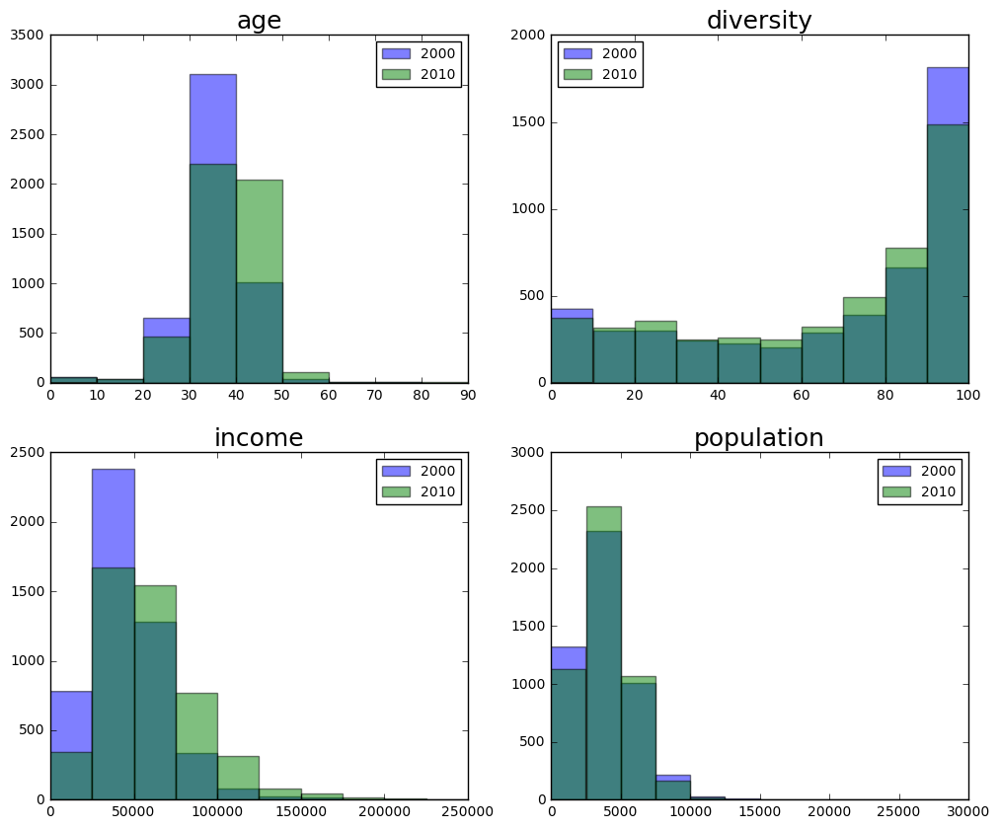

In [259]:
fig, ax = plt.subplots(2,2, figsize=(12,10))
coords = [(0,0), (0,1), (1,0), (1,1)]
c = 0
for i in features:
    ax[(coords[c])].hist(socio_00[i], bins= eval(i+'_bins'), label = "2000", alpha=0.5)
    ax[(coords[c])].set_title(i, fontsize=18)
    ax[(coords[c])].hist(socio_10[i], bins= eval(i+'_bins'), label = "2010", alpha=0.5)
    ax[(coords[c])].legend(fontsize = 10, loc='best')
    c += 1

# Figure 8 Age, Diversity, Income, and Population Distribution in 2000, 2010 Census Data
The age and population distributions are similar, in that the are both skewed to the left, with a majority of datapoints a the lower end and fewer and fewer datapoints at greater values.  Age is interesting with a large drop between 40 and 50, and very low numbers of older individuals (perhaps because NYC is so expensive and not necesarily a comfortable place for retirees).  Diversity also has an interesting distribution, with a large peak, showing that most NYC zipcodes are predominantly white. The two bins with the greatest number of zipcodes are at the whitest end of the spectrum, and then next largest is all the way at the other end of the spectrum.  The smallest number of zipcodes have diversity indeces (measured by the percentage of white residents) in the middle. In 2010, there is a moving towards the center: there are fewer neighborhoods with the lowest diversity, and an increase in the number of more mixed communities. Populationwise, from 2000 to 2010, smaller zipcodes grew, but the largest zipcodes shrank.  Incomes increased from 2000 to 2010, likely due to inflation.  The zipcodes also got older. 

### 7) Merge the df with the census tracts shapefile (see DATA and HINTS files) and display each of your features as a choropleth for both 2010 and 2000, and show the difference in the features as a third choroplath.

*** Downloading the NYC census tract shape file ***

2010 census tracts http://www1.nyc.gov/assets/planning/download/zip/data-maps/open-data/nyct2010_16d.zip
2000 census tracts http://www1.nyc.gov/assets/planning/download/zip/data-maps/open-data/nyct2000_16d.zip

In [91]:
#Download 2010 Census Tract Shapefile
!curl -O "http://www1.nyc.gov/assets/planning/download/zip/data-maps/open-data/nyct2010_16d.zip"
os.rename("nyct2010_16d.zip", "nyc_census_shape_file.zip")
shapefile="nyc_census_shape_file.zip"
os.system("mv " + shapefile + " " + os.getenv("PUIDATA"))
zf = zipfile.ZipFile(PUIDATA + "/" + shapefile, mode='r')
zf.extractall(PUIDATA + "/" +  "nyc_census_shape_file/")
zf.close()
shapefile = PUIDATA +"/nyc_census_shape_file/nyct2010_16d"

from geopandas import GeoDataFrame
shape_path = shapefile
ct_shape = GeoDataFrame.from_file(shape_path)

ct_shape.crs = from_epsg(2263)
ct_latlon = ct_shape.to_crs(epsg=4326)
ct_latlon.head()

# replace burough code with county FIPS code
for i in ct_latlon[ct_latlon.BoroCode == '5']:
    ct_latlon['CTY_FIPS']= '085' #Staten Island

ct_latlon['CTY_FIPS'][(ct_latlon.BoroCode == '2')] = '005' #Bronx
ct_latlon['CTY_FIPS'][(ct_latlon.BoroCode == '3')] = '047' #Brooklyn
ct_latlon['CTY_FIPS'][(ct_latlon.BoroCode == '4')] = '081' #Queens
ct_latlon['CTY_FIPS'][(ct_latlon.BoroCode == '1')] = '061' #Manhattan

# make a geo_id that has US code and state code, add on the cty fips and the zipcode
id_prefx = '1400000US36'
ct_latlon['geo_id'] = id_prefx + ct_latlon.CTY_FIPS + ct_latlon.CT2010.astype(str)

ct_2010 = ct_latlon

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1455k  100 1455k    0     0  25.1M      0 --:--:-- --:--:-- --:--:-- 29.0M


/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/ipykernel/__main__.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/ipykernel/__main__.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/ipykernel/__main__.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packa

In [92]:
#Download 2000 Census Tract Shapefile
!curl -O "http://www1.nyc.gov/assets/planning/download/zip/data-maps/open-data/nyct2000_16d.zip"
os.rename("nyct2000_16d.zip", "nyc_census_shape_file.zip")
shapefile="nyc_census_shape_file.zip"
os.system("mv " + shapefile + " " + os.getenv("PUIDATA"))
zf = zipfile.ZipFile(PUIDATA + "/" + shapefile, mode='r')
zf.extractall(PUIDATA + "/" +  "nyc_census_shape_file/")
zf.close()
shapefile = PUIDATA +"/nyc_census_shape_file/nyct2000_16d"

from geopandas import GeoDataFrame
shape_path = shapefile
ct_shape = GeoDataFrame.from_file(shape_path)

ct_shape.crs = from_epsg(2263)
ct_latlon = ct_shape.to_crs(epsg=4326)
ct_latlon.head()

# replace burough code with county FIPS code
for i in ct_latlon[ct_latlon.BoroCode == '5']:
    ct_latlon['CTY_FIPS']= '085' #Staten Island

ct_latlon['CTY_FIPS'][(ct_latlon.BoroCode == '2')] = '005' #Bronx
ct_latlon['CTY_FIPS'][(ct_latlon.BoroCode == '3')] = '047' #Brooklyn
ct_latlon['CTY_FIPS'][(ct_latlon.BoroCode == '4')] = '081' #Queens
ct_latlon['CTY_FIPS'][(ct_latlon.BoroCode == '1')] = '061' #Manhattan

# make a geo_id that has US code and state code, add on the cty fips and the zipcode
id_prefx = '1400000US36'
ct_latlon['geo_id'] = id_prefx + ct_latlon.CTY_FIPS + ct_latlon.CT2000.astype(str)

ct_2000 = ct_latlon

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1486k  100 1486k    0     0  19.0M      0 --:--:-- --:--:-- --:--:-- 20.1M


/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/ipykernel/__main__.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/ipykernel/__main__.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/ipykernel/__main__.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packa

*** Merge Census Tract Shape GeoDataFrame with Features DataFrame ***

In [93]:
#Merge 2000 and 2010 census dataframes with census tract shapefile
feat_00 = pd.merge(ct_2000, census00, how='inner', on='geo_id')

print ('2000 Census Tract length: ', (shape(ct_2000)))
print ('2000 Census length: ', (shape(census00)))
print ('2000 Merged: ', (shape(feat_00)))

feat_10 = pd.merge(ct_2010, census10, how='inner', on='geo_id')

print ('2010 Census Tract length: ', (shape(ct_2010)))
print ('2010 Census length: ', (shape(census10)))
print ('2010 Merged: ', (shape(feat_10)))

2000 Census Tract length:  (2216, 14)
2000 Census length:  (4855, 6)
2000 Merged:  (2193, 19)
2010 Census Tract length:  (2166, 14)
2010 Census length:  (4870, 6)
2010 Merged:  (2140, 19)


/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/geopandas/plotting.py:225: FutureWarning: 'colormap' is deprecated, please use 'cmap' instead (for consistency with matplotlib)
  "(for consistency with matplotlib)", FutureWarning)
/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/geopandas/plotting.py:229: FutureWarning: 'axes' is deprecated, please use 'ax' instead (for consistency with pandas)
  "(for consistency with pandas)", FutureWarning)


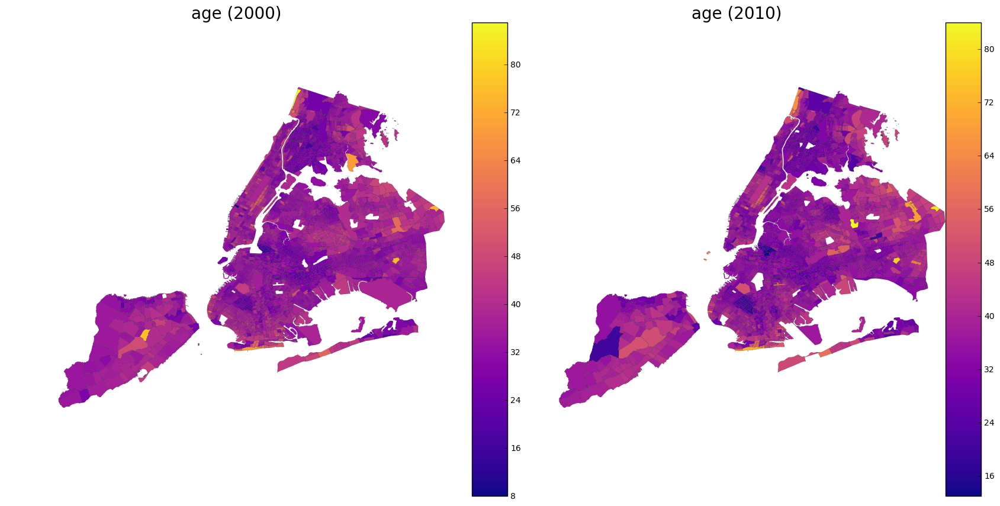

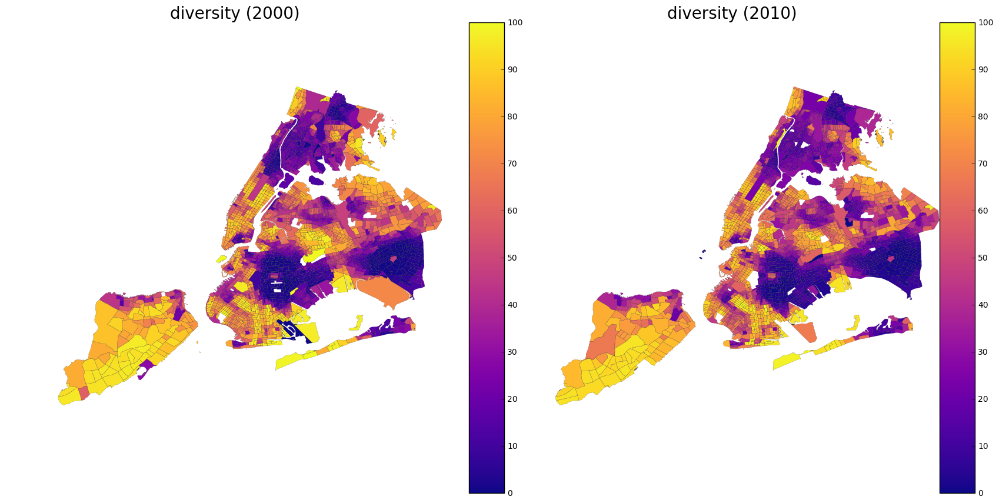

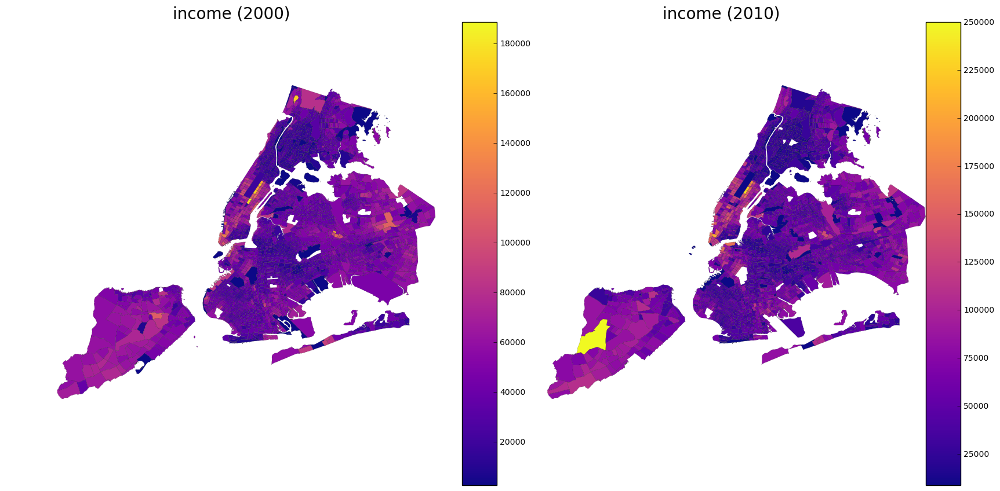

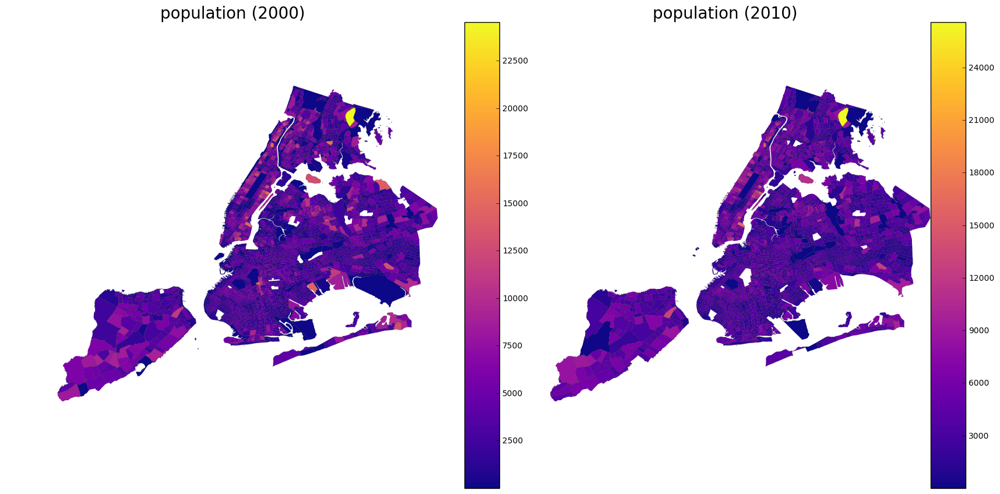

In [269]:
for i in features:
    f, ax = plt.subplots(figsize=(20,10))
#ax.get_xaxis().set_visible(False)
#ax.get_yaxis().set_visible(False)
#feat_00.plot(column='income',colormap='CMRmap',alpha=1,linewidth=0.1,ax=ax)

    ax1 = plt.subplot(121)
    ax1 = feat_00.plot(column= i, colormap='plasma',alpha = 1, linewidth=0.1, axes=ax1)
    plt.title(i+" (2000)", fontsize = 20)
    vmin, vmax = min(feat_00[i].values), \
                max(feat_00[i].values)
    ax1.axis('off')
    fig = ax1.get_figure()
    cax = fig.add_axes([0.5, 0.1, 0.03, 0.8])
    sm = plt.cm.ScalarMappable(cmap='plasma', norm=plt.Normalize(vmin=vmin, vmax=vmax))
    sm._A = []
    fig.colorbar(sm, cax=cax)
    
    ax2 = plt.subplot(122)
    ax2 = feat_10.plot(column= i, colormap='plasma',alpha = 1, axes=ax2, linewidth=0.1)
    plt.title(i +" (2010)", fontsize = 20)
    vmin, vmax = min(feat_10[i].values), \
                max(feat_10[i].values)
    ax2.axis('off')
    fig = ax2.get_figure()
    cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
    sm = plt.cm.ScalarMappable(cmap='plasma', norm=plt.Normalize(vmin=vmin, vmax=vmax))
    sm._A = []
    fig.colorbar(sm, cax=cax)

# Figure 9: Age, Diversity, Income, and Population Distribution across NYC Census Tracts in 2000 and 2010
In terms of age, Staten Island, outer Queens, the outer edges of the Bronx and the Rockaways are relatively older than other parts of the city.  Northern Brooklyn, Northern Manhattan, and the South Bronx are all comparatively younger. 
Staten Island is the least diverse burrough. Southeastern Queens, Northeastern Broolklyn, Northern Manhattan, and South Bronx are the least white regions of the city.  
Income appears to be spatially correlated to age, with Staten Island, and eastern Queens having relatively higher incomes than Northern Brooklyn, Northern Manhattan, and South Bronx.  Lower and midtown Manhattan, the upper west side and the upper east side have some of the highest incomes (indicated by the greater amounts of yellow), even though those regions don't appear to be comparitvely older than other lower income neighborhoods. 
Additionally, there appear to be single zipcodes that, for income and population, stand alone as outliers.  Analysis perhaps could be improved by removing those points.

In [94]:
feat_10[feat_10.income == max(feat_10.income)]

,BoroCT2010,BoroCode,BoroName,CDEligibil,CT2010_x,CTLabel,NTACode,NTAName,PUMA,Shape_Area,Shape_Leng,geometry,CTY_FIPS,geo_id,age,diversity,income,population,CT2010_y
2027,5022800,5,Staten Island,I,022800,228,SI05,New Springville-Bloomfield-Travis,3902,1.162300e+08,57616.504427,POLYGON ((-74.16341992126898 40.59244423467301...,085,1400000US36085022800,20,66.7,250000.0,105,022800


In [95]:
feat_10[feat_10.population == max(feat_10.population)]

,BoroCT2010,BoroCode,BoroName,CDEligibil,CT2010_x,CTLabel,NTACode,NTAName,PUMA,Shape_Area,Shape_Leng,geometry,CTY_FIPS,geo_id,age,diversity,income,population,CT2010_y
1991,2046201,2,Bronx,I,046201,462.01,BX13,Co-op City,3703,2.346360e+07,22014.912589,POLYGON ((-73.82027433015821 40.88555070032875...,005,1400000US36005046201,47,22.6,48005.0,26588,046201


Found the outlying income and population datapoints. Now to remove them, and repeat the analysis.

In [334]:
# Do these population sizes make sense?
size = [5, 10, 15, 20, 50, 100, 200, 250, 300]
for i in size:
    print ('Number of zips with a population below {}: {}'.format(i, len(feat_00[feat_00.population < i])))
    print ('In 2010: ', len(feat_10[feat_10.population < i]))

Number of zips with a population below 5: 6
In 2010:  6
Number of zips with a population below 10: 13
In 2010:  11
Number of zips with a population below 15: 15
In 2010:  13
Number of zips with a population below 20: 22
In 2010:  15
Number of zips with a population below 50: 35
In 2010:  23
Number of zips with a population below 100: 46
In 2010:  29
Number of zips with a population below 200: 57
In 2010:  36
Number of zips with a population below 250: 66
In 2010:  38
Number of zips with a population below 300: 71
In 2010:  38


There are 13 zipcodes that have a population less than 10. Those have to go, too.

In [96]:
# Don't rerun
feat_10 = (feat_10[~(feat_10.population == max(feat_10.population))]) 
feat_10 = (feat_10[~(feat_10.income == max(feat_10.income))]) 
feat_00 = (feat_00[~(feat_00.population == max(feat_00.population))]) 
feat_00 = (feat_00[~(feat_00.population < 10)]) 


In [97]:
len(feat_00.population)

2179

/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/geopandas/plotting.py:225: FutureWarning: 'colormap' is deprecated, please use 'cmap' instead (for consistency with matplotlib)
  "(for consistency with matplotlib)", FutureWarning)
/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/geopandas/plotting.py:229: FutureWarning: 'axes' is deprecated, please use 'ax' instead (for consistency with pandas)
  "(for consistency with pandas)", FutureWarning)


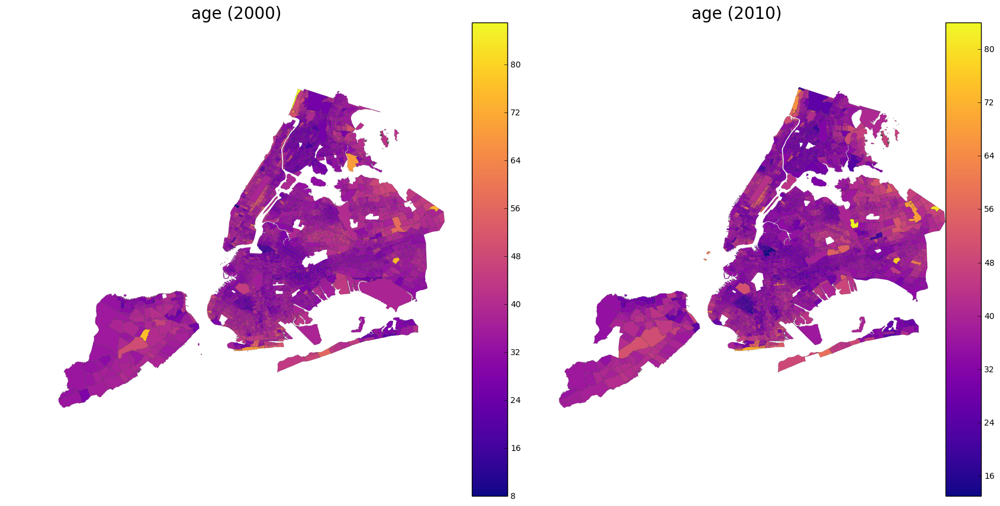

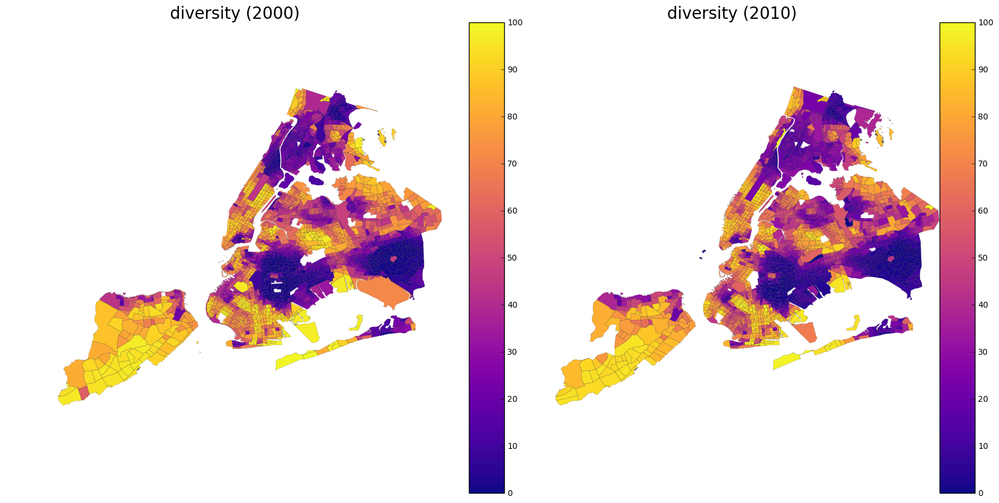

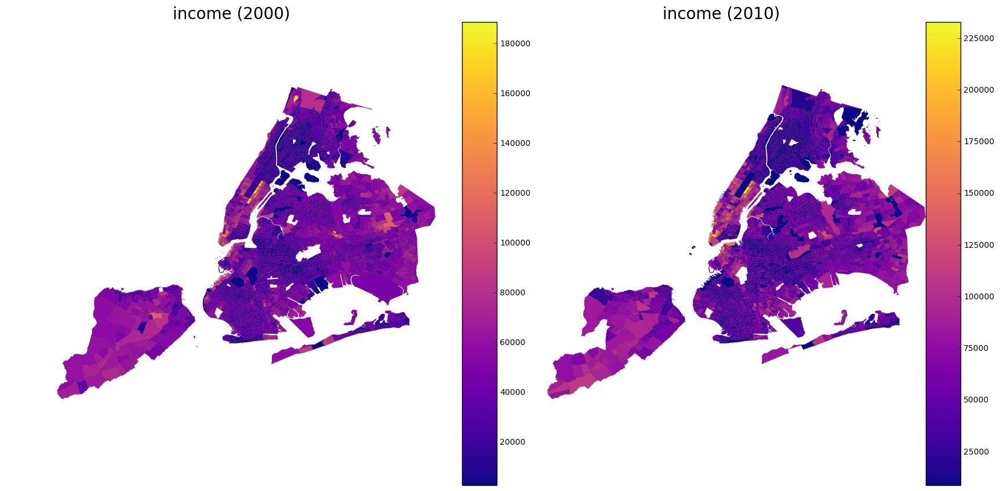

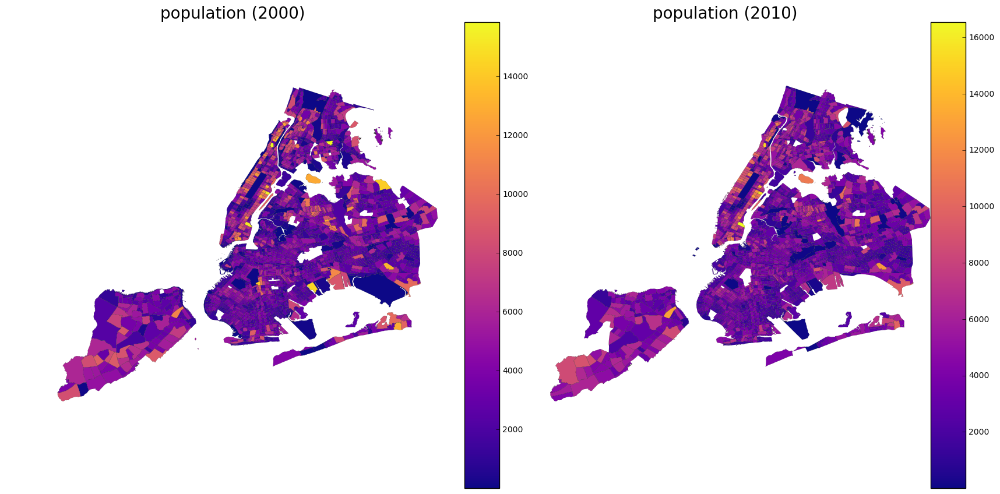

In [337]:
for i in features:
    f, ax = plt.subplots(figsize=(20,10))
#ax.get_xaxis().set_visible(False)
#ax.get_yaxis().set_visible(False)
#feat_00.plot(column='income',colormap='CMRmap',alpha=1,linewidth=0.1,ax=ax)

    ax1 = plt.subplot(121)
    ax1 = feat_00.plot(column= i, colormap='plasma',alpha = 1, linewidth=0.1, axes=ax1)
    plt.title(i+" (2000)", fontsize = 20)
    vmin, vmax = min(feat_00[i].values), \
                max(feat_00[i].values)
    ax1.axis('off')
    fig = ax1.get_figure()
    cax = fig.add_axes([0.5, 0.1, 0.03, 0.8])
    sm = plt.cm.ScalarMappable(cmap='plasma', norm=plt.Normalize(vmin=vmin, vmax=vmax))
    sm._A = []
    fig.colorbar(sm, cax=cax)
    
    ax2 = plt.subplot(122)
    ax2 = feat_10.plot(column= i, colormap='plasma',alpha = 1, axes=ax2, linewidth=0.1)
    plt.title(i +" (2010)", fontsize = 20)
    vmin, vmax = min(feat_10[i].values), \
                max(feat_10[i].values)
    ax2.axis('off')
    fig = ax2.get_figure()
    cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
    sm = plt.cm.ScalarMappable(cmap='plasma', norm=plt.Normalize(vmin=vmin, vmax=vmax))
    sm._A = []
    fig.colorbar(sm, cax=cax)

# Figure 10, as Figure 9, with three observations removed
The resolution of the population map is much clearer. Population appears to be roughly spatially correlated with income.  

*** Plotting the Difference in Each feature from 2000 to 2010 ***

In [338]:
feat_00.head()

,BoroCT2000,BoroCode,BoroName,CDEligibil,CT2000,CTLabel,NTACode,NTANAme,PUMA,Shape_Area,Shape_Leng,geometry,CTY_FIPS,geo_id,age,diversity,income,population,CT2010
0,1009800,1,Manhattan,I,009800,98,MN19,Turtle Bay-East Midtown,3808,1.906016e+06,5534.200060,POLYGON ((-73.96432543478758 40.75638153099089...,061,1400000US36061009800,37,85.2,67482.0,7066,009800
1,1010000,1,Manhattan,I,010000,100,MN19,Turtle Bay-East Midtown,3808,1.860938e+06,5692.168666,POLYGON ((-73.96802436915853 40.75957814005281...,061,1400000US36061010000,37,85.7,73906.0,1822,010000
2,1019000,1,Manhattan,E,019000,190,MN11,Central Harlem South,3803,1.117372e+06,4231.826340,POLYGON ((-73.94505127984516 40.80259859871747...,061,1400000US36061019000,32,5.5,16623.0,1818,019000
3,1020102,1,Manhattan,E,020102,201.02,MN11,Central Harlem South,3803,8.970680e+05,3745.871008,POLYGON ((-73.95441604408727 40.80572518022073...,061,1400000US36061020102,31,7.4,23146.0,3594,020102
4,1020600,1,Manhattan,E,020600,206,MN03,Central Harlem North-Polo Grounds,3803,1.602694e+06,5176.873151,POLYGON ((-73.93580780201182 40.80949763825762...,061,1400000US36061020600,35,6.9,25714.0,2310,020600


In [98]:
#merge 2000 and 2010 census tract dataframes
#keep only the tracts that are in both datasets
censustracts = pd.merge(ct_2000, ct_2010, on='geo_id', how='outer')

In [99]:
censustracts.columns

Index(['BoroCT2000', 'BoroCode_x', 'BoroName_x', 'CDEligibil_x', 'CT2000',
       'CTLabel_x', 'NTACode_x', 'NTANAme', 'PUMA_x', 'Shape_Area_x',
       'Shape_Leng_x', 'geometry_x', 'CTY_FIPS_x', 'geo_id', 'BoroCT2010',
       'BoroCode_y', 'BoroName_y', 'CDEligibil_y', 'CT2010', 'CTLabel_y',
       'NTACode_y', 'NTAName', 'PUMA_y', 'Shape_Area_y', 'Shape_Leng_y',
       'geometry_y', 'CTY_FIPS_y'],
      dtype='object')

In [100]:
censustracts.drop(['BoroCT2000', 'BoroCode_x', 'BoroName_x', 'CDEligibil_x', 'CT2000',
       'CTLabel_x', 'NTACode_x', 'NTANAme', 'PUMA_x', 'Shape_Area_x',
       'Shape_Leng_x','BoroCT2010',
       'BoroCode_y', 'BoroName_y', 'CDEligibil_y', 'CT2010', 'CTLabel_y',
       'NTACode_y', 'NTAName', 'PUMA_y', 'Shape_Area_y', 'Shape_Leng_y',
       'geometry_y', 'CTY_FIPS_y'], axis=1, inplace=True)

In [101]:
censustracts.rename(columns={"geometry_x" : 'geometry', "CTY_FIPS_x": "CTY_FIPS"}, inplace = True)

In [102]:
censustracts.head()

,geometry,CTY_FIPS,geo_id
0,POLYGON ((-73.96432543478758 40.75638153099089...,061,1400000US36061009800
1,POLYGON ((-73.96802436915853 40.75957814005281...,061,1400000US36061010000
2,POLYGON ((-73.94505127984516 40.80259859871747...,061,1400000US36061019000
3,POLYGON ((-73.95441604408727 40.80572518022073...,061,1400000US36061020102
4,POLYGON ((-73.93580780201182 40.80949763825762...,061,1400000US36061020600


In [103]:
# Joing 2000 feature data to complete census tract
censustracts = pd.merge(censustracts, census00, on='geo_id', how='left')

In [104]:
# Joing 2010 feature data to complete census tract
censustracts = pd.merge(censustracts, census10, on='geo_id', how='left', suffixes=('_2000', '_2010'))

In [105]:
censustracts.columns

Index(['geometry', 'CTY_FIPS', 'geo_id', 'age_2000', 'diversity_2000',
       'income_2000', 'population_2000', 'CT2010_2000', 'age_2010',
       'diversity_2010', 'income_2010', 'population_2010', 'CT2010_2010'],
      dtype='object')

In [106]:
censustracts.head()

,geometry,CTY_FIPS,geo_id,age_2000,diversity_2000,income_2000,population_2000,CT2010_2000,age_2010,diversity_2010,income_2010,population_2010,CT2010_2010
0,POLYGON ((-73.96432543478758 40.75638153099089...,061,1400000US36061009800,37.0,85.2,67482.0,7066.0,009800,37.0,81.8,101191.0,7316.0,009800
1,POLYGON ((-73.96802436915853 40.75957814005281...,061,1400000US36061010000,37.0,85.7,73906.0,1822.0,010000,38.0,74.8,82488.0,1992.0,010000
2,POLYGON ((-73.94505127984516 40.80259859871747...,061,1400000US36061019000,32.0,5.5,16623.0,1818.0,019000,37.0,21.7,54135.0,3083.0,019000
3,POLYGON ((-73.95441604408727 40.80572518022073...,061,1400000US36061020102,31.0,7.4,23146.0,3594.0,020102,32.0,23.2,37798.0,3865.0,020102
4,POLYGON ((-73.93580780201182 40.80949763825762...,061,1400000US36061020600,35.0,6.9,25714.0,2310.0,020600,35.0,14.3,31389.0,2942.0,020600


In [107]:
censustracts.isnull().sum()

geometry           237
CTY_FIPS           237
geo_id               0
age_2000           260
diversity_2000     260
income_2000        290
population_2000    260
CT2010_2000        260
age_2010           313
diversity_2010     313
income_2010        343
population_2010    313
CT2010_2010        313
dtype: int64

In [108]:
censustracts.dropna(how = 'any', inplace = True)

The nulls were dropped, since missing data points do not lend themselves to the analysis, which requires data from 2000 and from 2010 in order to analyze the change over time.

In [109]:
for i in features:
    print (i)
    censustracts[i+'_delt'] = censustracts[i+'_2010'] - censustracts[i+'_2000']

age
diversity
income
population


In [110]:
censustracts.head()

,geometry,CTY_FIPS,geo_id,age_2000,diversity_2000,income_2000,population_2000,CT2010_2000,age_2010,diversity_2010,income_2010,population_2010,CT2010_2010,age_delt,diversity_delt,income_delt,population_delt
0,POLYGON ((-73.96432543478758 40.75638153099089...,061,1400000US36061009800,37.0,85.2,67482.0,7066.0,009800,37.0,81.8,101191.0,7316.0,009800,0.0,-3.4,33709.0,250.0
1,POLYGON ((-73.96802436915853 40.75957814005281...,061,1400000US36061010000,37.0,85.7,73906.0,1822.0,010000,38.0,74.8,82488.0,1992.0,010000,1.0,-10.9,8582.0,170.0
2,POLYGON ((-73.94505127984516 40.80259859871747...,061,1400000US36061019000,32.0,5.5,16623.0,1818.0,019000,37.0,21.7,54135.0,3083.0,019000,5.0,16.2,37512.0,1265.0
3,POLYGON ((-73.95441604408727 40.80572518022073...,061,1400000US36061020102,31.0,7.4,23146.0,3594.0,020102,32.0,23.2,37798.0,3865.0,020102,1.0,15.8,14652.0,271.0
4,POLYGON ((-73.93580780201182 40.80949763825762...,061,1400000US36061020600,35.0,6.9,25714.0,2310.0,020600,35.0,14.3,31389.0,2942.0,020600,0.0,7.4,5675.0,632.0


/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/geopandas/plotting.py:225: FutureWarning: 'colormap' is deprecated, please use 'cmap' instead (for consistency with matplotlib)
  "(for consistency with matplotlib)", FutureWarning)
/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/geopandas/plotting.py:229: FutureWarning: 'axes' is deprecated, please use 'ax' instead (for consistency with pandas)
  "(for consistency with pandas)", FutureWarning)


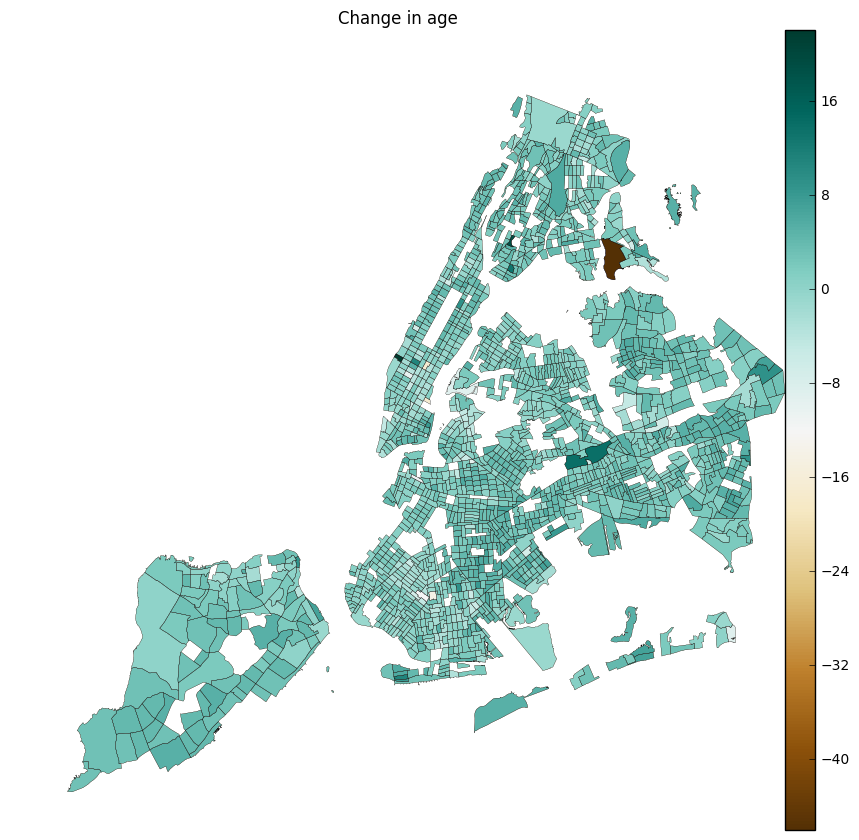

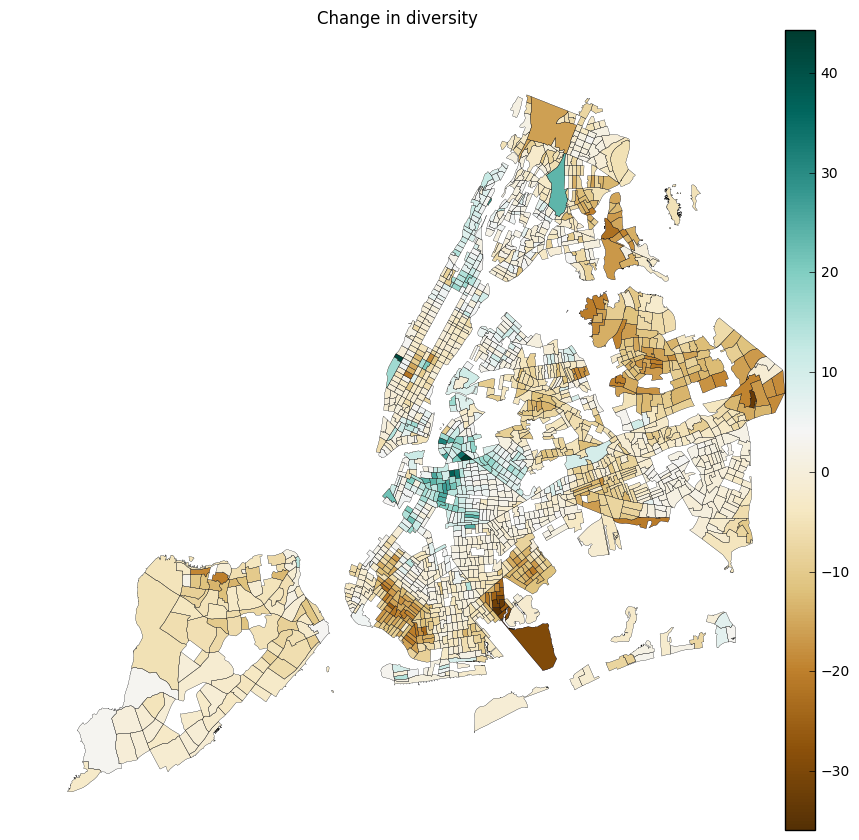

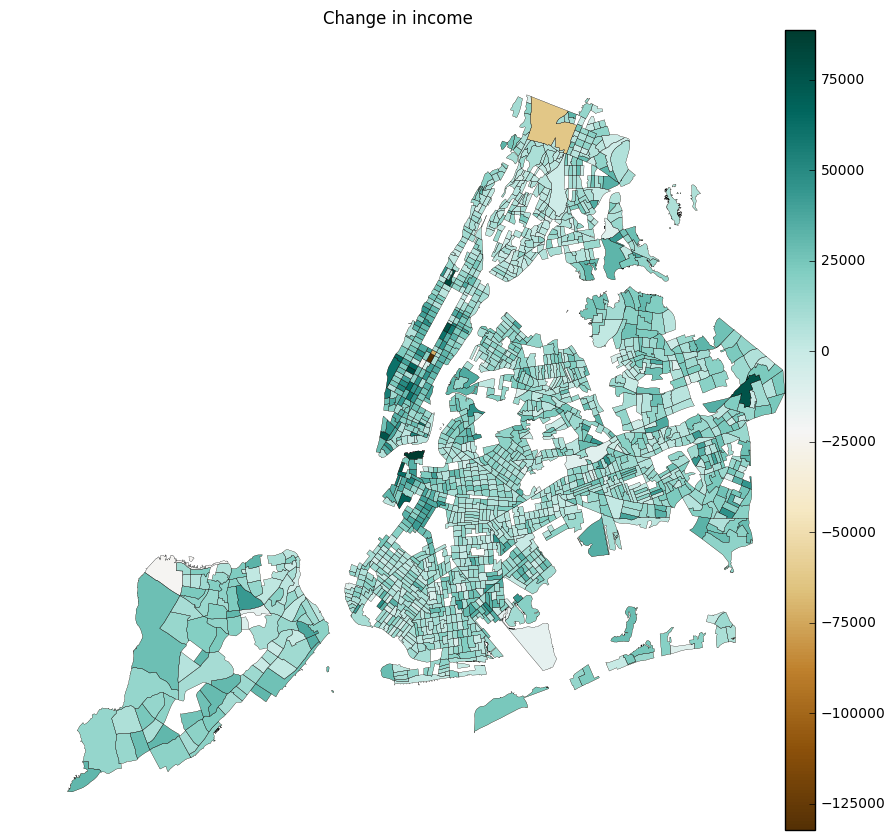

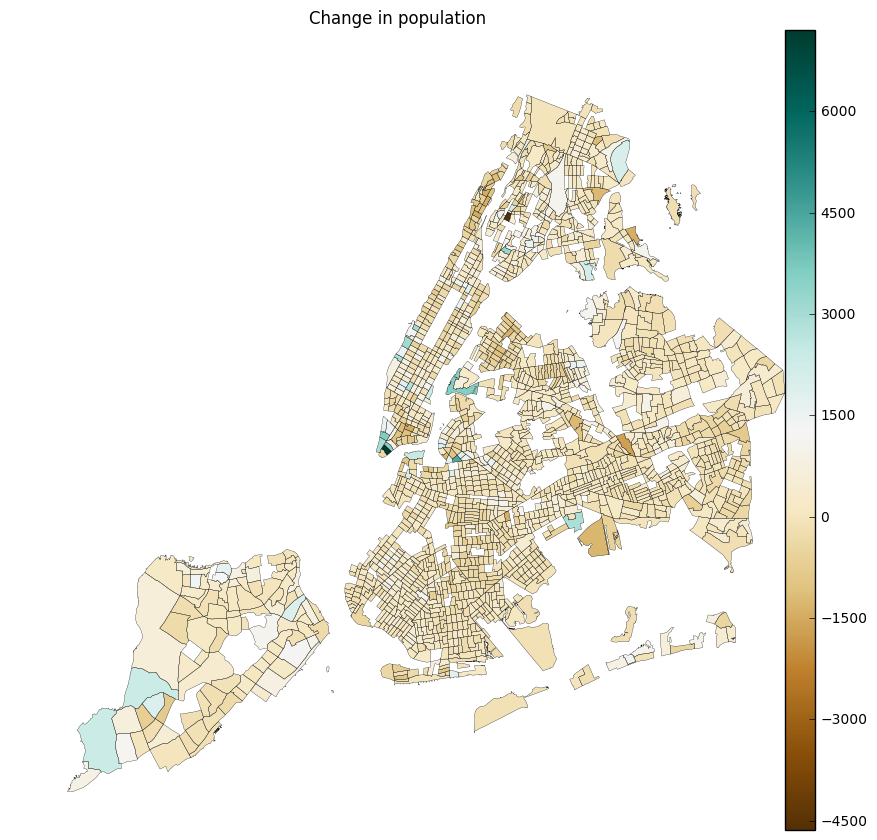

In [358]:
for i in features: 
    f, ax = plt.subplots(figsize=(10,10))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    censustracts.plot(column=i+'_delt',colormap='coolwarm',alpha=1,linewidth=0.1,ax=ax)
    plt.title("Change in "+i)

    ax =  censustracts.plot(column=i+'_delt', colormap='BrBG',alpha = 1,linewidth=0.1, axes=ax)
    vmin, vmax = min(censustracts[i+'_delt'].values),\
                            max(censustracts[i+'_delt'].values)

    ax.axis('off')
    fig = ax.get_figure()
    cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
    sm = plt.cm.ScalarMappable(cmap='BrBG', norm=plt.Normalize(vmin=vmin, vmax=vmax))
    sm._A = []
    fig.colorbar(sm, cax=cax)

# Figure 10 Change from 2000 to 2010 in Age, Income, Diversity, and Population for NYC Census Tracts
It appears that, from 2000 to 2010, most census tracts decreased on population, with a few select census tracts increasing (Long Island City, DUMBO, the Financial District, among others). In terms of diversity, Staten Island, the outer parts of Brooklyn Queens , the Bronx, and midtown Manhattan, all became less white.  Downtown Brooklyn and the surrounding neighborhoods (as far east as Prospect Park), the Southern part of Queens, and Harlem all become more white and less diverse.  The change in age and income are difficult to interpret due to single outlying census tracts.

### 8) (OPTIONAL) Cluster the census tracts on these four features (using a Eucledian distance)

See notebook titled PUI2016_Final_Part2_bg1672

### 9) (OPTIONAL) Identify the census tracts that have changed cluster assignment (those that are now associated with a different group of census tracts) and show a choropleth of the clusters in 2010, 2000 and a choropleth of the cluster changes. (Once you get through this, you have done most of the heavy lifting! The rest is building upon this work.)

### 10) Aggregate the census four features at the zipcode level and merge the zipcode dataframe

Census DataFrame = censustracts  
ZipCode DataFrame = nyc_biz and nyc_biz2 (biz2 has the outliers removed)

In [111]:
# Check the projections of each dataframe
print ('Census Tract Projection: ', censustracts.crs)
print ('ZipCode Projection: ', nyc_biz.crs)

Census Tract Projection:  {'no_defs': True, 'init': 'epsg:4326'}
ZipCode Projection:  {'no_defs': True, 'init': 'epsg:4326'}


Both dataframes have the same projection.

In [112]:
for i in censustracts:
    print (i)

geometry
CTY_FIPS
geo_id
age_2000
diversity_2000
income_2000
population_2000
CT2010_2000
age_2010
diversity_2010
income_2010
population_2010
CT2010_2010
age_delt
diversity_delt
income_delt
population_delt


In [113]:
for i in nyc_biz:
    print (i)

CTY_FIPS
PO_NAME
ST_FIPS
borough
geometry
zip
geo_id_prefx
2000_est
2010_est
Shape_Area
2000_density
2010_density
dens_change


Then "aggregate" all features by **taking the mean over each census tract in a zipcode: for every census tract in a particular zipcode take the mean of all age values, of all population values, of all income values, and of all diversity values etc. and assign those means to the zipcode**

Shapefiles read in with geopanda objects as GeoDataFrame contain the attribute geometry:
gdf.geometry

that contains the attribute centroid
gdf.geometry.centroid

which (generally) contains an object of type POINT which is a set of 2 numbers: the longitude and latitude or easting and northing in our case.
To find if a shape contains a file guide yourself with HW12 You want to ask: "does the SHAPE zipcode contain the POINT census tract center?"
For each zipcode find the census tracts that are contained in it and take the mean of the features in those census tracts. This may take some computing time cause you will probably have to do it in a loop. So do some testing of your lines of code before running the entire loop and make sure you do not do it at the last minute!
THIS is a computationally expensive task! you can help that by being smart, for example check that the ct and zip are in the same borough before you as ".contains" (HOWEVER: there is also a less computationally intense way to do it: you can work with the common portions of the geo_id tag and group !)

*** HOWEVER: there is also a less computationally intense way to do it: you can work with the common portions of the geo_id tag and group !)***  
Make a group for each burough using the geoid

In [114]:
#Group CTs by burrough based on County Fips
man_ct = censustracts[(censustracts['CTY_FIPS'] == '061')]
bx_ct = censustracts[(censustracts['CTY_FIPS'] == '005')]
bk_ct = censustracts[(censustracts['CTY_FIPS'] == '047')]
q_ct = censustracts[(censustracts['CTY_FIPS'] == '081')]
si_ct = censustracts[(censustracts['CTY_FIPS'] == '085')]

In [115]:
#Group Zipcode-Businessdata frame by burrough
man_zip = nyc_biz[(nyc_biz['CTY_FIPS'] == '061')]
bx_zip = nyc_biz[(nyc_biz['CTY_FIPS'] == '005')]
bk_zip = nyc_biz[(nyc_biz['CTY_FIPS'] == '047')]
q_zip = nyc_biz[(nyc_biz['CTY_FIPS'] == '081')]
si_zip = nyc_biz[(nyc_biz['CTY_FIPS'] == '085')]

*** "does the SHAPE zipcode contain the POINT census tract center?" For each zipcode find the census tracts that are contained in it and take the mean of the features in those census tracts. ***  
For each burrough:  
- Does the zipcode geometry polygon containt the census tract geometry point?
for i in ct_latlon.index:
    polygon = ct_latlon.geometry[i]
    if shapely.geometry.asShape(polygon).contains(cusp):
        ct_cusp = ct_latlon.BCTCB2010[i]#code from Ben Alpert
        print('CUSP is contained in', ct_cusp)
        break
    else: 
        continue
- assign the zipcode to that census tract  
(create a new zipcode column)  
- mean the features of each zipcode  
(make a for loop that goes through each zipcode, use the zipcode as a mask, mean the features)   
(make a "new" dataframe and mean across the df and then append it to a new df?)  
station_id['WinterAve']=df_winter.mean(skipna = True)



In [116]:
si_ct['zip'] = 'xxxxx'
for i in si_ct.index:
    point = si_ct.geometry.centroid[i]
    for j in si_zip.index:
        polygon = si_zip.geometry[j]
        if shapely.geometry.asShape(polygon).contains(point):
            si_ct['zip'][i] = si_zip.loc[j].zip

/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/ipykernel/__main__.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/IPython/core/interactiveshell.py:2881: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.h

In [117]:
si_zpfeat = pd.DataFrame()
for i in (si_zip.zip):
    df = (pd.DataFrame((si_ct[(si_ct.zip == i)].mean())))
    df.rename(columns={0 : i}, inplace = True)
    si_zpfeat = pd.concat((si_zpfeat, df), axis=1)

In [118]:
si_zpfeat

,10301,10310,10303,10302,10304,10314,10305,10306,10308,10312,10309,10307
age_2000,34.416667,31.428571,29.428571,33.000,35.10,37.823529,35.727273,38.111111,37.80,35.714286,34.500,33.0
diversity_2000,58.400000,56.057143,42.071429,62.625,59.18,82.011765,80.209091,92.677778,95.84,92.185714,90.725,94.1
income_2000,47557.500000,43618.428571,42703.571429,46729.750,44666.70,60360.352941,44877.727273,59320.888889,61380.80,69530.428571,66154.500,57209.0
population_2000,3058.000000,2976.000000,3304.857143,3657.500,4313.40,4440.588235,3562.272727,4456.111111,5369.40,5326.857143,6249.250,3868.0
age_2010,36.083333,32.571429,31.285714,32.500,37.00,40.411765,38.272727,41.444444,41.60,39.857143,38.000,36.0
diversity_2010,55.466667,49.714286,34.085714,51.025,55.65,76.464706,74.445455,89.588889,93.88,90.242857,91.250,91.2
income_2010,57523.333333,58637.714286,50614.714286,61289.750,51110.20,77211.823529,59594.909091,78332.222222,83821.20,87927.857143,83264.500,88413.0
population_2010,3147.333333,3284.571429,3792.142857,4512.250,4818.10,4513.000000,3871.545455,4578.222222,5257.20,5411.428571,7313.250,4741.0
age_delt,1.666667,1.142857,1.857143,-0.500,1.90,2.588235,2.545455,3.333333,3.80,4.142857,3.500,3.0
diversity_delt,-2.933333,-6.342857,-7.985714,-11.600,-3.53,-5.547059,-5.763636,-3.088889,-1.96,-1.942857,0.525,-2.9


*** Manhattan: Aggregate Census Tract Features data into zipcode ***

In [119]:
# Find and Assign each census tract to the correct zipcode 
man_ct['zip'] = 'xxxxx'
for i in man_ct.index:
    point = man_ct.geometry.centroid[i]
    for j in man_zip.index:
        polygon = man_zip.geometry[j]
        if shapely.geometry.asShape(polygon).contains(point):
            man_ct['zip'][i] = man_zip.loc[j].zip

#Calculate the mean of each feature for each zipcode
man_zpfeat = pd.DataFrame()
for i in (man_zip.zip):
    df = (pd.DataFrame((man_ct[(man_ct.zip == i)].mean())))
    df.rename(columns={0 : i}, inplace = True)
    man_zpfeat = pd.concat((man_zpfeat, df), axis=1)
man_zpfeat.head()

/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app
/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/ipykernel/__main__.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/IPython/core/interactiveshell.py:2881: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stabl

,10463,10034,10033,10040,10032,10031,10039,10030,10027,10037,...,10096,10265,10045,10080,10260,10285,10286,10069,10281,10282
CT2010_2000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CT2010_2010,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CTY_FIPS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
age_2000,31.0,31.8,32.625,33.500000,31.777778,31.857143,32.50,32.75,31.230769,41.666667,...,NaN,NaN,NaN,NaN,28.0,NaN,NaN,32.0,NaN,NaN
age_2010,34.0,35.8,35.000,36.333333,34.333333,33.285714,33.25,34.00,31.923077,41.333333,...,NaN,NaN,NaN,NaN,29.0,NaN,NaN,35.0,NaN,NaN


*** Bronx Aggregate Features ***

In [120]:
# Find and Assign each census tract to the correct zipcode 
bx_ct['zip'] = 'xxxxx'
for i in bx_ct.index:
    point = bx_ct.geometry.centroid[i]
    for j in bx_zip.index:
        polygon = bx_zip.geometry[j]
        if shapely.geometry.asShape(polygon).contains(point):
            bx_ct['zip'][i] = bx_zip.loc[j].zip

#Calculate the mean of each feature for each zipcode
bx_zpfeat = pd.DataFrame()
for i in (bx_zip.zip):
    df = (pd.DataFrame((bx_ct[(bx_ct.zip == i)].mean())))
    df.rename(columns={0 : i}, inplace = True)
    bx_zpfeat = pd.concat((bx_zpfeat, df), axis=1)
bx_zpfeat.head()

/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app
/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/ipykernel/__main__.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/IPython/core/interactiveshell.py:2881: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stabl

,10471,10470,10466,10467,10463,10475,10464,10464,10464,10469,...,10452,10456,10472,10459,10451,10473,10474,10455,10454,11370
CT2010_2000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CT2010_2010,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CTY_FIPS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
age_2000,36.4,36.0,33.0000,31.10,37.833333,39.666667,NaN,NaN,NaN,36.777778,...,26.833333,27.857143,30.000000,27.666667,29.714286,32.181818,24.0,26.777778,25.500,NaN
age_2010,37.4,37.0,35.0625,31.95,39.583333,42.666667,NaN,NaN,NaN,37.000000,...,30.000000,30.000000,32.166667,28.833333,35.285714,33.818182,27.0,29.333333,28.875,NaN


*** Brooklyn Agrregate Data ***

In [121]:
# Find and Assign each census tract to the correct zipcode 
bk_ct['zip'] = 'xxxxx'
for i in bk_ct.index:
    point = bk_ct.geometry.centroid[i]
    for j in bk_zip.index:
        polygon = bk_zip.geometry[j]
        if shapely.geometry.asShape(polygon).contains(point):
            bk_ct['zip'][i] = bk_zip.loc[j].zip

#Calculate the mean of each feature for each zipcode
bk_zpfeat = pd.DataFrame()
for i in (bk_zip.zip):
    df = (pd.DataFrame((bk_ct[(bk_ct.zip == i)].mean())))
    df.rename(columns={0 : i}, inplace = True)
    bk_zpfeat = pd.concat((bk_zpfeat, df), axis=1)
bk_zpfeat.head()

/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app
/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/ipykernel/__main__.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/IPython/core/interactiveshell.py:2881: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stabl

,11221,11216,11233,11213,11212,11225,11218,11226,11219,11210,...,11236,11220,11234,11209,11228,11229,11214,11223,11235,11224
CT2010_2000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CT2010_2010,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CTY_FIPS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
age_2000,29.111111,31.600000,29.55,29.125,27.888889,32.818182,32.6,31.642857,28.714286,31.80,...,32.894737,31.571429,37.054054,38.375000,38.555556,39.60,38.52,35.84,43.25,41.111111
age_2010,31.777778,33.733333,32.20,31.375,31.277778,34.818182,32.2,34.357143,26.952381,34.16,...,35.736842,32.571429,38.918919,38.958333,40.000000,40.32,38.60,35.88,44.50,46.333333


*** Queens Aggregate Data ***

In [122]:
# Find and Assign each census tract to the correct zipcode 
q_ct['zip'] = 'xxxxx'
for i in q_ct.index:
    point = q_ct.geometry.centroid[i]
    for j in q_zip.index:
        polygon = q_zip.geometry[j]
        if shapely.geometry.asShape(polygon).contains(point):
            q_ct['zip'][i] = q_zip.loc[j].zip

#Calculate the mean of each feature for each zipcode
q_zpfeat = pd.DataFrame()
for i in (q_zip.zip):
    df = (pd.DataFrame((q_ct[(q_ct.zip == i)].mean())))
    df.rename(columns={0 : i}, inplace = True)
    q_zpfeat = pd.concat((q_zpfeat, df), axis=1)
q_zpfeat.head()

/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app
/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/ipykernel/__main__.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/IPython/core/interactiveshell.py:2881: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stabl

,11372,11004,11040,11426,11365,11373,11001,11375,11427,11374,...,11412,11411,11413,11422,11420,11417,11414,11430,11096,11096
CT2010_2000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CT2010_2010,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CTY_FIPS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
age_2000,35.2,40.666667,NaN,38.0,37.666667,33.176471,40.0,40.285714,37.428571,39.25,...,34.736842,38.181818,35.066667,34.428571,32.4375,33.428571,41.5,NaN,NaN,NaN
age_2010,37.6,45.666667,NaN,39.0,40.166667,35.058824,42.0,41.642857,41.142857,40.75,...,37.368421,42.090909,38.466667,36.714286,35.1875,35.285714,45.5,NaN,NaN,NaN


In [123]:
#Calculate the mean of each feature for each zipcode
bk_zpfeat = pd.DataFrame()
for i in (bk_zip.zip):
    df = (pd.DataFrame((bk_ct[(bk_ct.zip == i)].mean())))
    df.rename(columns={0 : i}, inplace = True)
    bk_zpfeat = pd.concat((bk_zpfeat, df), axis=1)
bk_zpfeat.head()

,11221,11216,11233,11213,11212,11225,11218,11226,11219,11210,...,11236,11220,11234,11209,11228,11229,11214,11223,11235,11224
CT2010_2000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CT2010_2010,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CTY_FIPS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
age_2000,29.111111,31.600000,29.55,29.125,27.888889,32.818182,32.6,31.642857,28.714286,31.80,...,32.894737,31.571429,37.054054,38.375000,38.555556,39.60,38.52,35.84,43.25,41.111111
age_2010,31.777778,33.733333,32.20,31.375,31.277778,34.818182,32.2,34.357143,26.952381,34.16,...,35.736842,32.571429,38.918919,38.958333,40.000000,40.32,38.60,35.88,44.50,46.333333


*** Merge census tract aggregates with zipcode/business dataframe ***

In [124]:
si_zpfeat.index

Index(['age_2000', 'diversity_2000', 'income_2000', 'population_2000',
       'age_2010', 'diversity_2010', 'income_2010', 'population_2010',
       'age_delt', 'diversity_delt', 'income_delt', 'population_delt'],
      dtype='object')

In [125]:
#Drop anything but the features from each of the zpfeat dataframes
q_zpfeat.drop(['CT2010_2000', 'CT2010_2010', 'CTY_FIPS',\
               'geo_id', 'geometry', 'zip'], axis=0, inplace=True)
man_zpfeat.drop(['CT2010_2000', 'CT2010_2010', 'CTY_FIPS',
       'geo_id', 'geometry', 'zip'], axis=0, inplace=True)
bk_zpfeat.drop(['CT2010_2000', 'CT2010_2010', 'CTY_FIPS',
       'geo_id', 'geometry', 'zip'], axis=0, inplace=True)
bx_zpfeat.drop(['CT2010_2000', 'CT2010_2010', 'CTY_FIPS',
       'geo_id', 'geometry', 'zip'], axis=0, inplace=True)

In [126]:
#join the dataframes
zpfeat = pd.concat((q_zpfeat, man_zpfeat, bk_zpfeat, si_zpfeat, bx_zpfeat), axis=1)

In [127]:
# transpose the dataframe
zpfeat = zpfeat.transpose()

In [128]:
#merge zipcode busienss dataframe with aggregated census tract features
zip_five = pd.merge(nyc_biz2, zpfeat, right_index=True, left_on='zip', how='inner')

In [129]:
zip_five.rename(columns={'2000_density':'density_2000', '2010_density':'density_2010',\
                 'dens_change':'density_delt'}, inplace=True)

### 11) Repeat steps 7,8,9 at the zipcode level (NOT OPTIONAL AT THE ZIPCODE LEVEL) with the added feature (density of businesses).

### ZIP 7) Merge the df with the census tracts shapefile (see DATA and HINTS files) and display each of your features as a choropleth for both 2010 and 2000, and show the difference in the features as a third choroplath.

In [130]:
features.append('density')

*** Map each feature on a choropleth for 2000, 2010, and the change ***

/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/geopandas/plotting.py:225: FutureWarning: 'colormap' is deprecated, please use 'cmap' instead (for consistency with matplotlib)
  "(for consistency with matplotlib)", FutureWarning)
/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/geopandas/plotting.py:229: FutureWarning: 'axes' is deprecated, please use 'ax' instead (for consistency with pandas)
  "(for consistency with pandas)", FutureWarning)


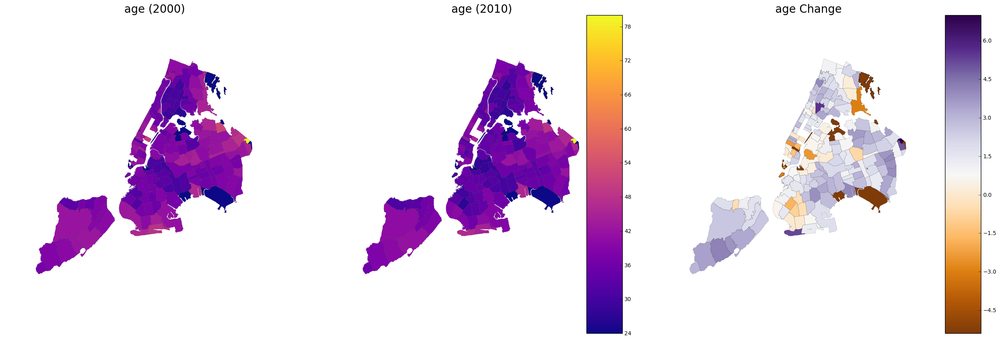

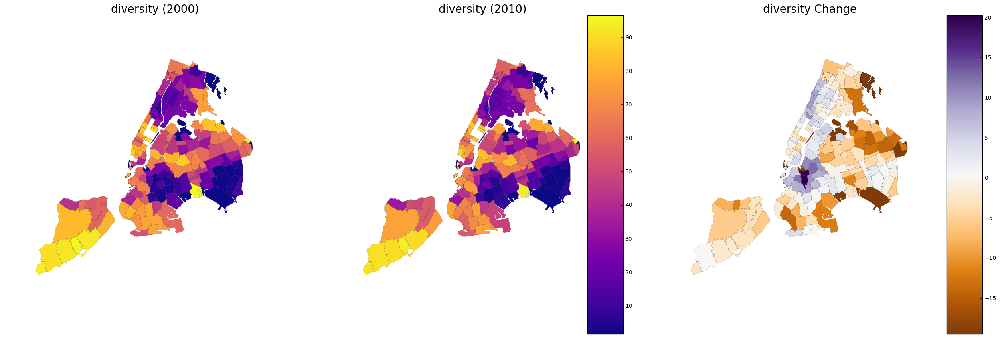

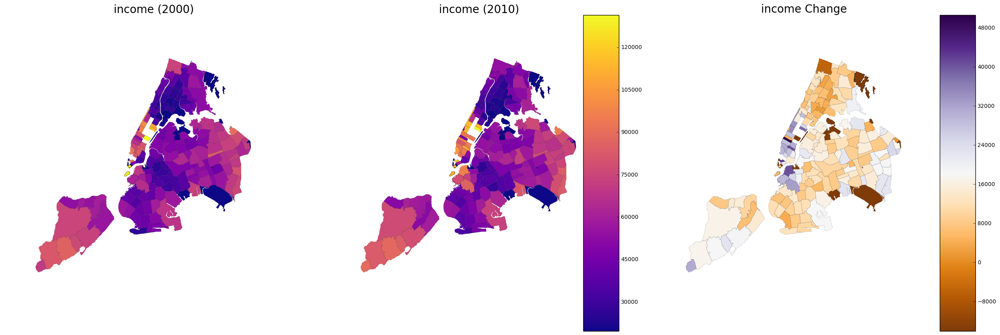

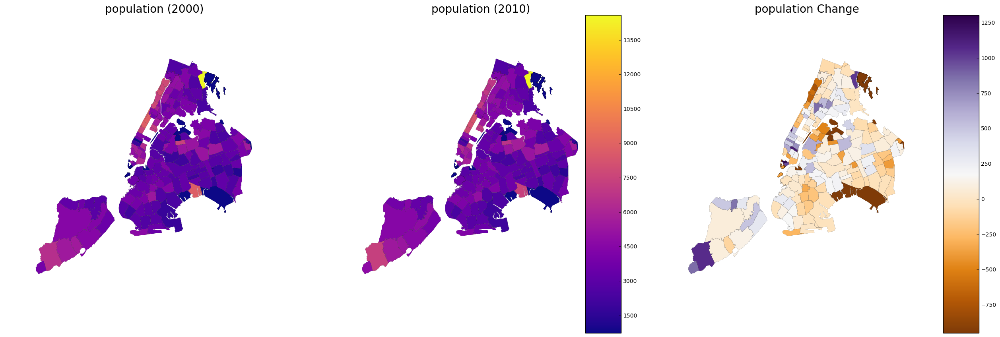

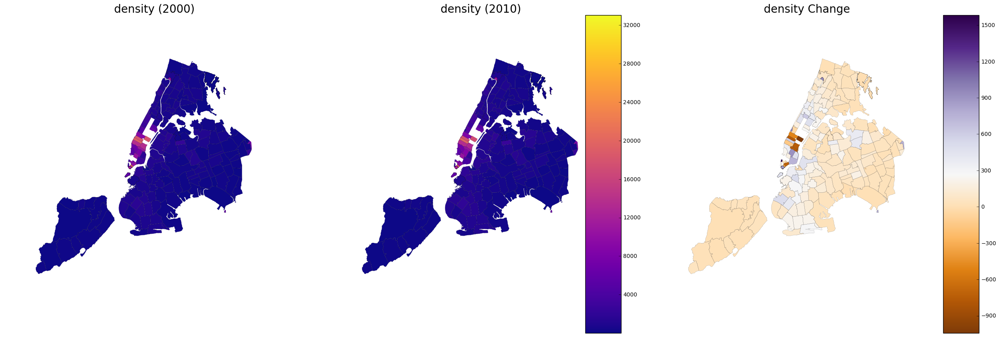

In [131]:
for i in features:
    f, ax = plt.subplots(figsize=(30,10))
#ax.get_xaxis().set_visible(False)
#ax.get_yaxis().set_visible(False)
#feat_00.plot(column='income',colormap='CMRmap',alpha=1,linewidth=0.1,ax=ax)

    ax1 = plt.subplot(131)
    ax1 = zip_five.plot(column= i+'_2000', colormap='plasma',alpha = 1, linewidth=.1, axes=ax1)
    plt.title(i+" (2000)", fontsize = 20)
    vmin, vmax = min(zip_five[i+'_2000'].values), \
                max(zip_five[i+'_2000'].values)
    ax1.axis('off')
    fig = ax1.get_figure()
    cax = fig.add_axes([0.4, 0.1, 0.03, 0.8])
    sm = plt.cm.ScalarMappable(cmap='plasma', norm=plt.Normalize(vmin=vmin, vmax=vmax))
    sm._A = []
    fig.colorbar(sm, cax=cax)
    
    ax2 = plt.subplot(132)
    ax2 = zip_five.plot(column= i+'_2010', colormap='plasma',alpha = 1, linewidth=.1, axes=ax2)
    plt.title(i +" (2010)", fontsize = 20)
    vmin, vmax = min(zip_five[i+'_2010'].values), \
                max(zip_five[i+'_2010'].values)
    ax2.axis('off')
    fig = ax2.get_figure()
    cax = fig.add_axes([0.6, 0.1, 0.03, 0.8])
    sm = plt.cm.ScalarMappable(cmap='plasma', norm=plt.Normalize(vmin=vmin, vmax=vmax))
    sm._A = []
    fig.colorbar(sm, cax=cax)
    
    ax3 = plt.subplot(133)
    ax3 = zip_five.plot(column= i+'_delt', colormap='PuOr',alpha = 1,linewidth=.1, axes=ax3)
    plt.title(i +" Change", fontsize = 20)
    vmin, vmax = min(zip_five[i+'_delt'].values), \
                max(zip_five[i+'_delt'].values)
    ax3.axis('off')
    fig = ax3.get_figure()
    cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
    sm = plt.cm.ScalarMappable(cmap='PuOr', norm=plt.Normalize(vmin=vmin, vmax=vmax))
    sm._A = []
    fig.colorbar(sm, cax=cax)

# Figure 11 As Figure 9 and 10, at the Zip Code Level
There appear to be some distinct regions of change.  
Midtown Manhattan got younger, richer, and grew in size.  Some zipcodes saw a dramatic increase in the density of businesses, and some saw a dramatic reduction.  
The biggest change was in diversity of north west of Brooklyn, which got dramatically whiter, and the outer edges of Queens, Brooklyn, the Bronx, and Staten Island, which all got dramatically less white. Those same neighborhoods also got older, and poorer (with the exception of some zipcodes in Staten Island).  And although the density of businesses did not decrease in those neighborhoods, the rate at which the density increased was less than in neighborhoods that saw increased whiteness. Those same neighborhoods also saw a decrease in populations.


### ZIP 8) Cluster the census tracts on these four features (using a Eucledian distance)

*** Use K-means Clustering to cluster each zipcode based on 5-dimensional ***

In [132]:
zip_five.drop(['cluster_2000', 'cluster_2010', 'cluster_delt'], axis=1, inplace=True)

ValueError: labels ['cluster_2000' 'cluster_2010' 'cluster_delt'] not contained in axis

In [134]:
clust_00.columns

Index(['PO_NAME', 'density_2000', 'age_2000', 'diversity_2000', 'income_2000',
       'population_2000'],
      dtype='object')

In [135]:
# Must remove the NaN
zip_five.dropna(how='any', inplace= True) #drop NaN

clust_00 = zip_five.drop(['CTY_FIPS', 'ST_FIPS', 'borough', 'geometry', 'zip', 'geo_id_prefx',
        '2010_est', 'Shape_Area', '2000_est', '2010_est', 'density_2010',
       'density_delt', 'age_2010', 'age_delt', 
       'diversity_2010', 'diversity_delt', 'income_2010',
       'income_delt', 'population_2010', 'population_delt', 'PO_NAME'], axis=1)

clust00_normd = skl.preprocessing.scale(clust_00, axis=0)

clust00_normd = pd.DataFrame(clust00_normd) #convert array to dataframe
clust00_normd.index = clust_00.index #add index back on
clust00_normd.columns = clust_00.columns #add columns back on

In [137]:
# repeat for 2010 data
clust_10 = zip_five.drop(['CTY_FIPS', 'ST_FIPS', 'borough', 'geometry', 'zip', 'geo_id_prefx',
       '2000_est', 'Shape_Area', 'density_2000',
       'density_delt', 'age_2000','age_delt', 'diversity_2000',
       'diversity_delt', 'income_2000', '2000_est', '2010_est',
       'income_delt', 'population_2000',  'population_delt', 'PO_NAME'], axis=1)

clust10_normd = skl.preprocessing.scale(clust_10, axis=0)

clust10_normd = pd.DataFrame(clust10_normd) #convert array to dataframe
clust10_normd.index = clust_10.index #add index back on
clust10_normd.columns = clust_10.columns #add columns back on

In [138]:
shape(clust00_normd)

(178, 5)

The sklearn  k-means implementations takes several arguments. The ones that are relevant here are :  
**random_state** which is equivalent to setting the seed, and thus its needed for reproducibility, and  
**init** : particularly the fact that, as the docnstring says: “If an ndarray is passed  it should be of shape (n_clusters, n_features) and gives the initial centers.”

So you can pass the centers that were the output of the clustering of 2000 to the clustering of 2010 with the keyword init

In [139]:
# Use Kmeans to cluster the data
# Use a seed so Kmeans analysis is reproducible
nc = 3 #number of clusters

km00= KMeans(n_clusters=nc, random_state=444)
#for 2010, use the cluster centers from 2000
#km10= KMeans(n_clusters=nc, random_state=444, init=km00.cluster_centers_)

km00.fit(clust00_normd)

KMeans(copy_x=True, init='k-means++', max_iter=300, n_clusters=3, n_init=10,
    n_jobs=1, precompute_distances='auto', random_state=444, tol=0.0001,
    verbose=0)

In [140]:
# Use Kmeans to cluter the data
# Use a seed so Kmeans analysis is reproducible
nc = 3 #number of clusters

#km00= KMeans(n_clusters=nc, random_state=444)
#for 2010, use the cluster centers from 2000
km10= KMeans(n_clusters=nc, random_state=444, init=km00.cluster_centers_)

km10.fit(clust10_normd)

/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/sklearn/cluster/k_means_.py:821: RuntimeWarning: Explicit initial center position passed: performing only one init in k-means instead of n_init=10
  n_jobs=self.n_jobs)


KMeans(copy_x=True,
    init=array([[-0.3257 , -0.56407, -0.83472, -0.59834,  0.13447],
       [-0.36344,  0.65242,  0.78145,  0.16774, -0.17798],
       [ 1.90815,  0.36121,  0.95704,  1.58715, -0.03455]]),
    max_iter=300, n_clusters=3, n_init=10, n_jobs=1,
    precompute_distances='auto', random_state=444, tol=0.0001, verbose=0)

In [141]:
zip_five['cluster_2000'] = km00.predict(clust00_normd)
zip_five['cluster_2010'] = km10.predict(clust10_normd)
zip_five.head()

,CTY_FIPS,PO_NAME,ST_FIPS,borough,geometry,zip,geo_id_prefx,2000_est,2010_est,Shape_Area,...,diversity_2010,diversity_delt,income_2000,income_2010,income_delt,population_2000,population_2010,population_delt,cluster_2000,cluster_2010
0,081,Jackson Heights,36,Queens,POLYGON ((-73.86942457284175 40.74915687096787...,11372,1400000US360081,1409.0,1629.0,0.608114,...,46.950000,-4.050000,39694.300000,49288.000000,9593.700000,7118.600000,6690.500000,-428.100000,0,0
1,081,Glen Oaks,36,Queens,POLYGON ((-73.71068374074007 40.75004039450917...,11004,1400000US360081,189.0,229.0,0.681596,...,48.400000,-12.400000,58212.333333,75587.333333,17375.000000,5457.666667,5607.000000,149.333333,1,1
3,081,Bellerose,36,Queens,POLYGON ((-73.72270447144122 40.75373371438336...,11426,1400000US360081,213.0,248.0,1.487893,...,37.820000,-19.480000,50010.600000,74999.400000,24988.800000,4093.200000,4299.200000,206.000000,1,1
4,081,Fresh Meadows,36,Queens,POLYGON ((-73.81088634744755 40.72717187575918...,11365,1400000US360081,553.0,643.0,2.091553,...,37.383333,-12.916667,54028.166667,69373.333333,15345.166667,5314.666667,5663.000000,348.333333,1,1
5,081,Elmhurst,36,Queens,POLYGON ((-73.88722098467157 40.72752618766134...,11373,1400000US360081,1244.0,1498.0,1.286234,...,26.288235,-4.547059,38199.529412,46391.000000,8191.470588,5110.705882,5219.588235,108.882353,0,0


### ZIP 9) Identify the census tracts that have changed cluster assignment (those that are now associated with a different group of census tracts) and show a choropleth of the clusters in 2010, 2000 and a choropleth of the cluster changes. (Once you get through this, you have done most of the heavy lifting! The rest is building upon this work.)

/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/geopandas/plotting.py:225: FutureWarning: 'colormap' is deprecated, please use 'cmap' instead (for consistency with matplotlib)
  "(for consistency with matplotlib)", FutureWarning)
/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/geopandas/plotting.py:229: FutureWarning: 'axes' is deprecated, please use 'ax' instead (for consistency with pandas)
  "(for consistency with pandas)", FutureWarning)


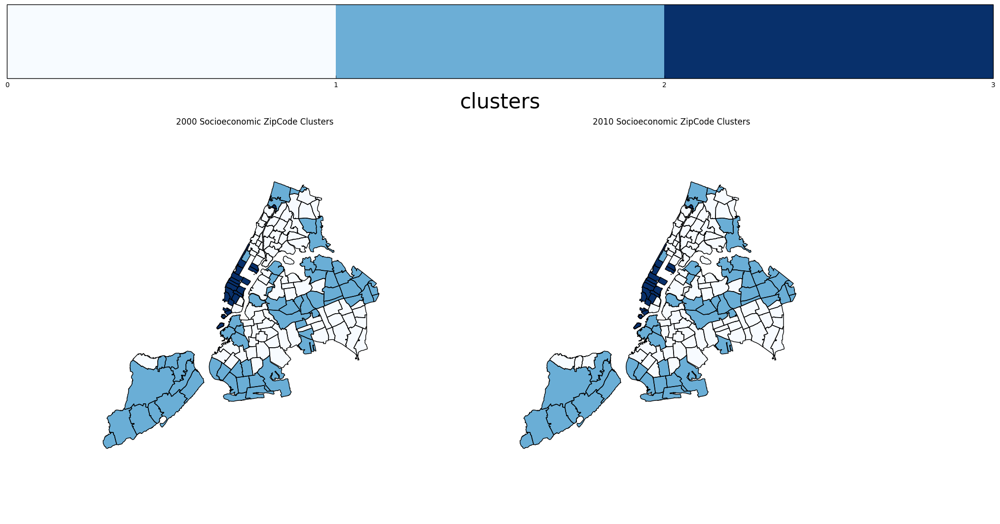

In [142]:
# choropleth of each cluster, and the cluster changes

fig = pl.figure(figsize=(20, 10))
ax1 = fig.add_axes([0.05, 1.0, 1, 0.15])
cmap = mpl.cm.Blues
norm = mpl.colors.Normalize(vmin=0, vmax=5)

#adding a color bar to identify the clusters on the map
# ColorbarBase derives from ScalarMappable and puts a colorbar
# in a specified axes, so it has everything needed for a
# standalone colorbar. 
bounds = range(nc + 1)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
cb3 = mpl.colorbar.ColorbarBase(ax1, cmap=cmap,
                                norm=norm,
                                ticks=bounds,
                                spacing='uniform',
                                orientation='horizontal')
cb3.set_label('clusters', fontsize=30)
ax = fig.add_subplot(121)
zip_five.plot(column='cluster_2000', colormap='Blues', alpha = 1, axes=ax)
tmp = ax.axis('off')
plt.title('2000 Socioeconomic ZipCode Clusters')
ax1 = fig.add_subplot(122)
zip_five.plot(column='cluster_2010', colormap='Blues', alpha = 1, axes=ax1)
tmp = ax1.axis('off')
plt.title('2010 Socioeconomic ZipCode Clusters')

# Figure 12: NYC ZipCode SocioEconomic Clusters in 2000 and 2010, 3 Clusters

In [143]:
zip_five['cluster_delt'] = abs(zip_five.cluster_2010 - zip_five.cluster_2000)

/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/geopandas/plotting.py:225: FutureWarning: 'colormap' is deprecated, please use 'cmap' instead (for consistency with matplotlib)
  "(for consistency with matplotlib)", FutureWarning)
/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/geopandas/plotting.py:229: FutureWarning: 'axes' is deprecated, please use 'ax' instead (for consistency with pandas)
  "(for consistency with pandas)", FutureWarning)


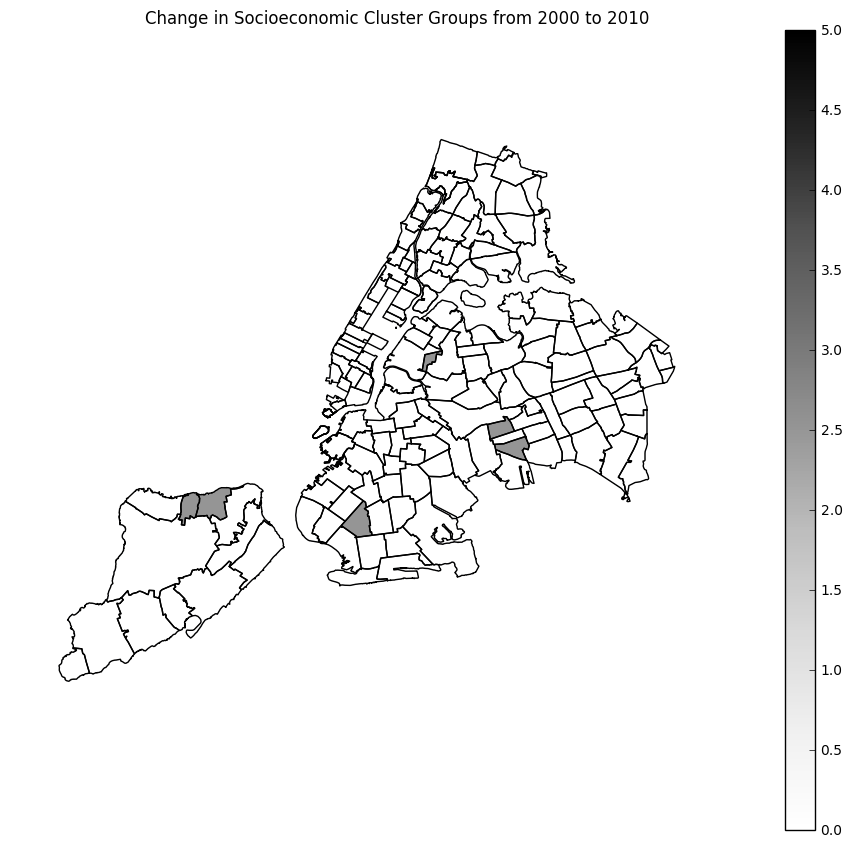

In [144]:
f, ax = plt.subplots(figsize=(10,10))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
zip_five.plot(column='cluster_delt',colormap='coolwarm',alpha=1,linewidth=0.1,ax=ax)
plt.title("Change in Socioeconomic Cluster Groups from 2000 to 2010")

ax = zip_five.plot(column='cluster_delt', colormap='Greys',alpha = 1, axes=ax)
vmin, vmax = 0, 5
            
ax.axis('off')
fig = ax.get_figure()
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
#0.05, 1.0, 1, 0.15
sm = plt.cm.ScalarMappable(cmap='Greys', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
fig.colorbar(sm, cax=cax)

# Figure 13: Socioeconomic cluster changes from 2000 to 2010 in NYC Zipcodes, 3 Clusters

In [145]:
zip_five.drop(['cluster_2000', 'cluster_2010', 'cluster_delt'], axis=1, inplace=True)

In [146]:
# Use Kmeans to cluster the data
# Use a seed so Kmeans analysis is reproducible
nc = 5 #number of clusters

km00= KMeans(n_clusters=nc, random_state=444)
#for 2010, use the cluster centers from 2000
#km10= KMeans(n_clusters=nc, random_state=444, init=km00.cluster_centers_)

km00.fit(clust00_normd)

KMeans(copy_x=True, init='k-means++', max_iter=300, n_clusters=5, n_init=10,
    n_jobs=1, precompute_distances='auto', random_state=444, tol=0.0001,
    verbose=0)

In [148]:
# Use Kmeans to cluter the data
# Use a seed so Kmeans analysis is reproducible
nc = 5 #number of clusters

#km00= KMeans(n_clusters=nc, random_state=444)
#for 2010, use the cluster centers from 2000
km10= KMeans(n_clusters=nc, random_state=444, init=km00.cluster_centers_)

km10.fit(clust10_normd)

/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/sklearn/cluster/k_means_.py:821: RuntimeWarning: Explicit initial center position passed: performing only one init in k-means instead of n_init=10
  n_jobs=self.n_jobs)


KMeans(copy_x=True,
    init=array([[-0.36316, -0.62211, -0.86888, -0.58006, -0.19205],
       [ 2.00969,  0.64611,  0.99771,  1.09492,  0.77982],
       [-0.37259,  0.67972,  0.79138,  0.16418, -0.25606],
       [-0.10553, -0.04346, -0.26453, -0.47537,  2.05095],
       [ 1.70509, -0.20859,  0.8757 ,  2.57159, -1.6633 ]]),
    max_iter=300, n_clusters=5, n_init=10, n_jobs=1,
    precompute_distances='auto', random_state=444, tol=0.0001, verbose=0)

In [149]:
zip_five['cluster_2000'] = km00.predict(clust00_normd)
zip_five['cluster_2010'] = km10.predict(clust10_normd)
zip_five.head()

,CTY_FIPS,PO_NAME,ST_FIPS,borough,geometry,zip,geo_id_prefx,2000_est,2010_est,Shape_Area,...,diversity_2010,diversity_delt,income_2000,income_2010,income_delt,population_2000,population_2010,population_delt,cluster_2000,cluster_2010
0,081,Jackson Heights,36,Queens,POLYGON ((-73.86942457284175 40.74915687096787...,11372,1400000US360081,1409.0,1629.0,0.608114,...,46.950000,-4.050000,39694.300000,49288.000000,9593.700000,7118.600000,6690.500000,-428.100000,3,3
1,081,Glen Oaks,36,Queens,POLYGON ((-73.71068374074007 40.75004039450917...,11004,1400000US360081,189.0,229.0,0.681596,...,48.400000,-12.400000,58212.333333,75587.333333,17375.000000,5457.666667,5607.000000,149.333333,2,2
3,081,Bellerose,36,Queens,POLYGON ((-73.72270447144122 40.75373371438336...,11426,1400000US360081,213.0,248.0,1.487893,...,37.820000,-19.480000,50010.600000,74999.400000,24988.800000,4093.200000,4299.200000,206.000000,2,2
4,081,Fresh Meadows,36,Queens,POLYGON ((-73.81088634744755 40.72717187575918...,11365,1400000US360081,553.0,643.0,2.091553,...,37.383333,-12.916667,54028.166667,69373.333333,15345.166667,5314.666667,5663.000000,348.333333,2,2
5,081,Elmhurst,36,Queens,POLYGON ((-73.88722098467157 40.72752618766134...,11373,1400000US360081,1244.0,1498.0,1.286234,...,26.288235,-4.547059,38199.529412,46391.000000,8191.470588,5110.705882,5219.588235,108.882353,0,0


### ZIP 9) Identify the census tracts that have changed cluster assignment (those that are now associated with a different group of census tracts) and show a choropleth of the clusters in 2010, 2000 and a choropleth of the cluster changes. (Once you get through this, you have done most of the heavy lifting! The rest is building upon this work.)

/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/geopandas/plotting.py:225: FutureWarning: 'colormap' is deprecated, please use 'cmap' instead (for consistency with matplotlib)
  "(for consistency with matplotlib)", FutureWarning)
/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/geopandas/plotting.py:229: FutureWarning: 'axes' is deprecated, please use 'ax' instead (for consistency with pandas)
  "(for consistency with pandas)", FutureWarning)


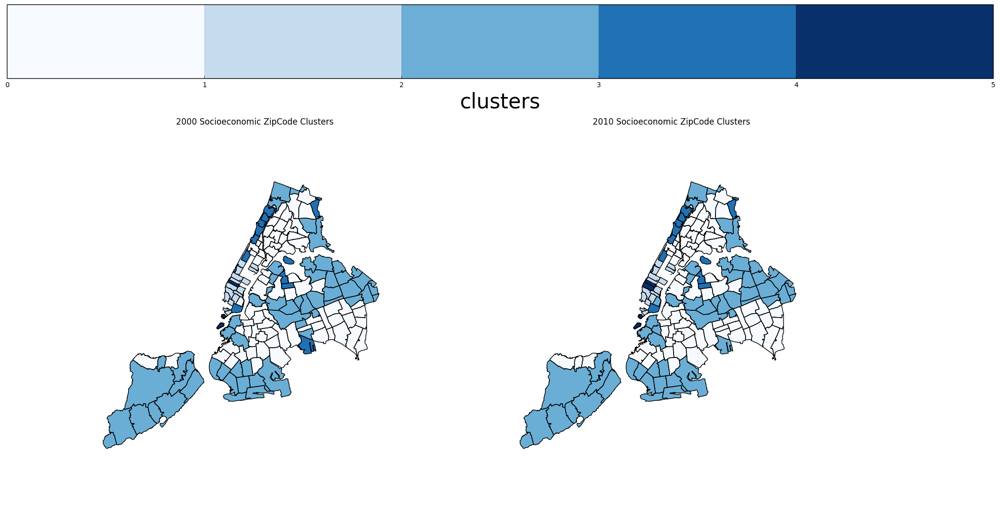

In [150]:
# choropleth of each cluster, and the cluster changes

fig = pl.figure(figsize=(20, 10))
ax1 = fig.add_axes([0.05, 1.0, 1, 0.15])
cmap = mpl.cm.Blues
norm = mpl.colors.Normalize(vmin=0, vmax=5)

#adding a color bar to identify the clusters on the map
# ColorbarBase derives from ScalarMappable and puts a colorbar
# in a specified axes, so it has everything needed for a
# standalone colorbar. 
bounds = range(nc + 1)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
cb3 = mpl.colorbar.ColorbarBase(ax1, cmap=cmap,
                                norm=norm,
                                ticks=bounds,
                                spacing='uniform',
                                orientation='horizontal')
cb3.set_label('clusters', fontsize=30)
ax = fig.add_subplot(121)
zip_five.plot(column='cluster_2000', colormap='Blues', alpha = 1, axes=ax)
tmp = ax.axis('off')
plt.title('2000 Socioeconomic ZipCode Clusters')
ax1 = fig.add_subplot(122)
zip_five.plot(column='cluster_2010', colormap='Blues', alpha = 1, axes=ax1)
tmp = ax1.axis('off')
plt.title('2010 Socioeconomic ZipCode Clusters')

# Figure 14: NYC ZipCode SocioEconomic Clusters in 2000 and 2010, 5 Clusters

In [151]:
zip_five['cluster_delt'] = abs(zip_five.cluster_2010 - zip_five.cluster_2000)

/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/geopandas/plotting.py:225: FutureWarning: 'colormap' is deprecated, please use 'cmap' instead (for consistency with matplotlib)
  "(for consistency with matplotlib)", FutureWarning)
/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/geopandas/plotting.py:229: FutureWarning: 'axes' is deprecated, please use 'ax' instead (for consistency with pandas)
  "(for consistency with pandas)", FutureWarning)


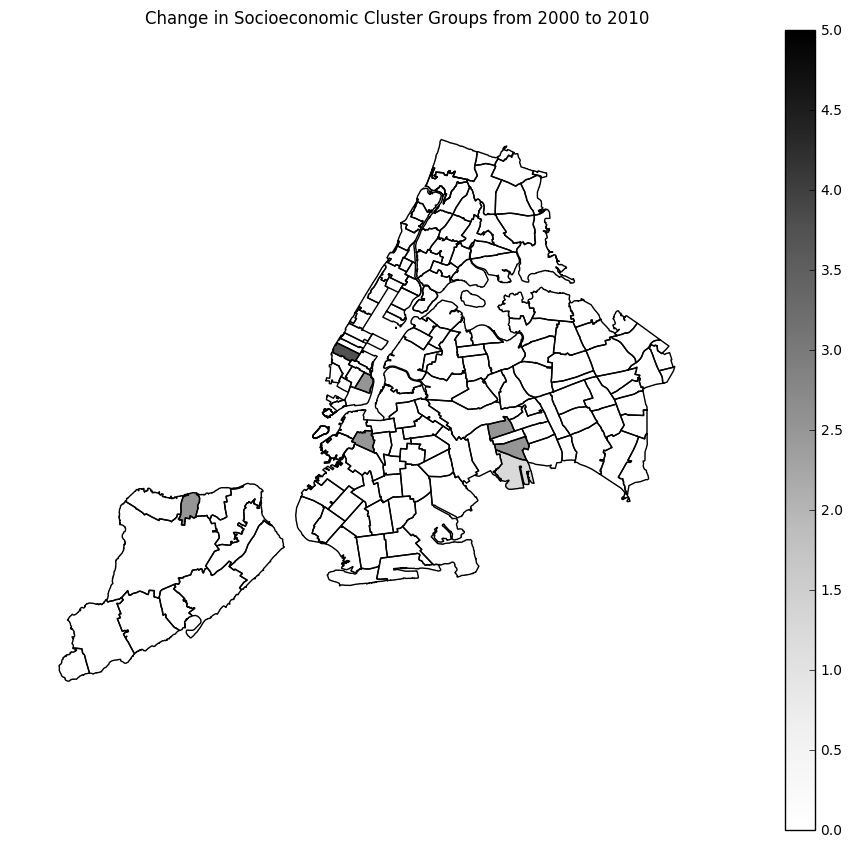

In [152]:
f, ax = plt.subplots(figsize=(10,10))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
zip_five.plot(column='cluster_delt',colormap='coolwarm',alpha=1,linewidth=0.1,ax=ax)
plt.title("Change in Socioeconomic Cluster Groups from 2000 to 2010")

ax = zip_five.plot(column='cluster_delt', colormap='Greys',alpha = 1, axes=ax)
vmin, vmax = 0, 5
            
ax.axis('off')
fig = ax.get_figure()
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
#0.05, 1.0, 1, 0.15
sm = plt.cm.ScalarMappable(cmap='Greys', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
fig.colorbar(sm, cax=cax)

# Figure 13: Socioeconomic cluster changes from 2000 to 2010 in NYC Zipcodes, 5 Clusters

### 12) Define a function that the census tract changed cluster assignments from the first to the second label, and if so finds the individual features that are significantly different as measured by Pearson's correlation, plot those zip codes, and plot a histogram of the features that have significantly changed. Run your function for all label pairs (2 points, one for the identification of locations that changed cluster and one for the identifiation of the features that changed significantly).

*** Args: ***
- Dataframe
- 2 cluster labels (ex: income and population)

Alpha = 0.05

In [153]:
def feature_change(df, cl1, cl2):
    """
    Take a data frame and two cluster labels: like 1 and 2
    Determines which features changed significantly between 2000 and 2010 
    ----------
    df : DataFrame
    cl1, cl2 : int
    Returns
    -------
    dict
    """
    pairbool1 = ((df.cluster_2000 == cl2) * (df.cluster_2010 == cl1))
    pairbool2 = ((df.cluster_2000 == cl1) * (df.cluster_2010 == cl2))
    features = ['age', 'diversity', 'income', 'population', 'density']
    if len(df[pairbool1 + pairbool2]) == 0:
        print ("No Clusters from ", cl1, "to ", cl2, " or vice versa.")
    else: 
        df = df[pairbool1 + pairbool2]
        for i in features:
            featsort_00 = df[i+'_2000'].sort_values()
            featsort_10 = df[i+'_2010'].sort_values()
            print (i+'_2000', i+'_2000')
            Pc, p = scipy.stats.pearsonr(featsort_00, featsort_10)
            print (Pc, p)
            if p > 0.95:
                pl.figure(figsize = (8, 8))
                h1 = pl.hist(featsort_00, label = "{} 2000".format(i), normed=False)
                h2 = pl.hist(featsort_10, label = "{} 2010".format(i), normed=False, alpha = 0.5)
                title = pl.title("histogram of {} in 2000 and 2010",format(i))
                leg = pl.legend()
                pl.xlabel('i')     

In [154]:
feature_change(zip_five, 3, 3)

age_2000 age_2000
0.985891974401 1.10439279315e-10
diversity_2000 diversity_2000
0.98888310411 2.66087731562e-11
income_2000 income_2000
0.956775432865 8.57639703072e-08
population_2000 population_2000
0.983339510864 2.9789470404e-10
density_2000 density_2000
0.999415133165 5.77151208976e-19


/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/pandas/computation/expressions.py:181: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))
/opt/rh/anaconda/root/envs/PUI2016_Python3/lib/python3.5/site-packages/pandas/computation/expressions.py:181: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  unsupported[op_str]))


# Analysis
Restricting to only 3 clusters results in only a few cluster changes between 2000 and 2010.  Doing the analysis previously with 5 clusters resulted in more changes. When analyzed the features were analyzed to determine which had significantly changed, there was no statistically signficant change in any of the features.  This is due primarily to the nature of the Pearson's Coefficient.  The statistic it produces is a correlation coefficient, along of a scale of -1 to 1, -1 being a direct negative relationship, 1 being a direct positive relationship, and 0 being no relationship at all.  The p-value indicates the liklihood of obtaining that same statistic from an uncorrelated pair of variables.  All the paired labels that I tested (and did not save the outputs of) produced very high Pearson's coefficients, and very low p-values.  This indicates that the features in 2000 were highly correlated to 2010, and therefore from the same distribution.  They are not statistically signficant.  It is helpful, however to consider the  to determine the relative correlation between features of 2000 and 2010 compariatively.  Unfortunately, I do not have my outputs saved from that analysis, and am struggling to redo them, since I have to rerun the very slow for loops that collapse the census tract data to the zopcode level (helpful hint: save outputs from computationally expensive code!) but I will reproduce the analysis for the census tracts. Please see the attached census tract notebook.